In [2]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
#plt.style.use('ggplot')


from itertools import cycle
import networkx as nx



from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC

from matplotlib_venn import venn2
from matplotlib_venn import venn3
from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

In [3]:
pd.set_option('display.max_columns', None)

In [8]:
sample_list = []
vcf_files = []
directory = "artificial"

for file in os.listdir(directory):
    if file.endswith(".snp.hf.pass.vcf"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['14621-68663-50-50', '14621-68663-80-20', '14621-68663-95-5', '16250874FFD', '56850173', 'AL-75607', 'AL14621', 'AL68663', 'BUR-PAR-50-50', 'BUR-PAR-80-20', 'BUR-PAR-90-10', 'BUR-PAR-95-5', 'BURGOS89109', 'FLA-SO-COL2-50-50', 'FLA-SO-COL2-80-20', 'FLA-SO-COL2-90-10', 'FLA-SO-COL2-95-5', 'SOMOZACOL2']
['artificial/14621-68663-50-50.snp.hf.pass.vcf', 'artificial/14621-68663-80-20.snp.hf.pass.vcf', 'artificial/14621-68663-95-5.snp.hf.pass.vcf', 'artificial/16250874FFD.snp.hf.pass.vcf', 'artificial/56850173.snp.hf.pass.vcf', 'artificial/AL-75607.snp.hf.pass.vcf', 'artificial/AL14621.snp.hf.pass.vcf', 'artificial/AL68663.snp.hf.pass.vcf', 'artificial/BUR-PAR-50-50.snp.hf.pass.vcf', 'artificial/BUR-PAR-80-20.snp.hf.pass.vcf', 'artificial/BUR-PAR-90-10.snp.hf.pass.vcf', 'artificial/BUR-PAR-95-5.snp.hf.pass.vcf', 'artificial/BURGOS89109.snp.hf.pass.vcf', 'artificial/FLA-SO-COL2-50-50.snp.hf.pass.vcf', 'artificial/FLA-SO-COL2-80-20.snp.hf.pass.vcf', 'artificial/FLA-SO-COL2-90-10.snp.hf.pass.vc

# Import vcf as dataframe

In [9]:
x = datetime.datetime.now()
print(x)
dict_vcf = {}
for vcf, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = import_VCF42_to_pandas(vcf)
y = datetime.datetime.now()
print(y)
print("Done with import in: %s" % (y - x))

2019-06-03 16:26:11.257058
2019-06-03 16:28:33.894335
Done with import in: 0:02:22.637277


In [10]:
dict_vcf[sample_list[2]].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF
0,MTB_anc,1126,.,C,T,6535.30,PASS,AC=2;AF=1.00;AN=2;DP=47;ExcessHet=0.0008;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,47:47:99:1720,140,0",2.0,1.0,2.0,47.0,0.0008,0.000,1.0000,60.0,25.36,0.822,1/1,"0,47",99.0,"1720,140,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,47.0,1,1,47.0,0.0,1.0
1,MTB_anc,1977,.,G,A,8943.77,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-1.703e+00;DP=4...,GT:AD:DP:GQ:PL,"1/1:0,44:44:99:1438,130,0",2.0,1.0,2.0,44.0,0.0034,0.000,0.7564,60.0,29.52,0.768,1/1,"0,44",99.0,"1438,130,0",-1.703,0.0,0.653,NaN,NaN,NaN,2,0.0,44.0,1,1,44.0,0.0,1.0
2,MTB_anc,2532,.,C,T,23564.32,PASS,AC=2;AF=1.00;AN=2;DP=21;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,21:21:62:652,62,0",2.0,1.0,2.0,21.0,3.0103,0.000,-0.0000,60.0,34.81,0.848,1/1,"0,21",62.0,"652,62,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,21.0,1,1,21.0,0.0,1.0
3,MTB_anc,7585,.,C,G,11259.09,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.23;DP=61;Exce...,GT:AD:DP:GQ:PL,"1/1:0,61:61:99:2201,183,0",2.0,1.0,2.0,61.0,0.0267,13.833,0.6162,60.0,30.51,0.672,1/1,"0,61",99.0,"2201,183,0",1.230,0.0,0.802,NaN,NaN,NaN,2,0.0,61.0,1,1,61.0,0.0,1.0
4,MTB_anc,9143,.,C,T,29236.32,PASS,AC=2;AF=1.00;AN=2;DP=36;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,36:36:99:1202,107,0",2.0,1.0,2.0,36.0,3.0103,0.000,-0.0000,60.0,34.89,0.857,1/1,"0,36",99.0,"1202,107,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,36.0,1,1,36.0,0.0,1.0


In [11]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'DP', 'ExcessHet', 'FS', 'InbreedingCoeff',
       'MQ', 'QD', 'SOR', 'GT', 'AD', 'GQ', 'PL', 'BaseQRankSum', 'MQRankSum',
       'ReadPosRankSum', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD',
       'gt0', 'gt1', 'dp', 'aF', 'AF'],
      dtype='object')

# Add repeat and snp distance info

In [12]:
#dict_vcf = {}

for name, vcf_df in dict_vcf.items():
    #Add repeat info (Phage, Transposon or PE/PPE regions)
    vcf_df['Is_repeat'] = vcf_df.apply(filter_repeats, axis=1)

    #Add info of nearby positions
    add_snp_distance(vcf_df)
    
    #Add info of clustered positions in sliding window
    add_window_distance(vcf_df, window_size=10)

In [13]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'DP', 'ExcessHet', 'FS', 'InbreedingCoeff',
       'MQ', 'QD', 'SOR', 'GT', 'AD', 'GQ', 'PL', 'BaseQRankSum', 'MQRankSum',
       'ReadPosRankSum', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD',
       'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat', 'snp_left_distance',
       'snp_right_distance', 'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [109]:
dict_dff = {}
distance = 25
QD = 6
window = 2
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= window)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [110]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].Is_repeat == True].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


In [111]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].snp_left_distance <= 30].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
177,MTB_anc,498557,.,A,C,4990.74,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=3.78;DP=15;Exce...,GT:AD:DP:GQ:PL,"1/1:0,15:15:45:572,45,0",2.0,1.0,2.0,15.0,0.0034,0.768,0.6963,60.0,30.06,0.824,1/1,"0,15",45.0,"572,45,0",3.78,0.0,0.785,NaN,NaN,NaN,2,0.0,15.0,1,1,15.0,0.0,1.0,False,26.0,7417.0,1
198,MTB_anc,565431,.,G,A,2451.30,PASS,AC=2;AF=1.00;AN=2;DP=23;ExcessHet=0.0008;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,23:23:69:845,69,0",2.0,1.0,2.0,23.0,0.0008,0.000,1.0000,60.0,27.76,1.478,1/1,"0,23",69.0,"845,69,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,23.0,1,1,23.0,0.0,1.0,False,27.0,224.0,1


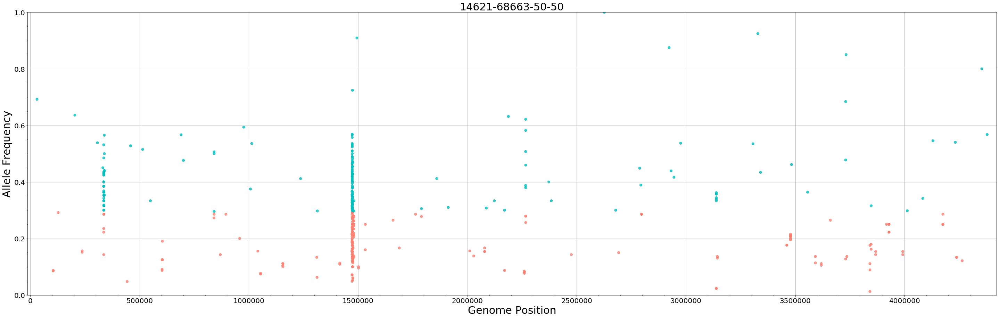

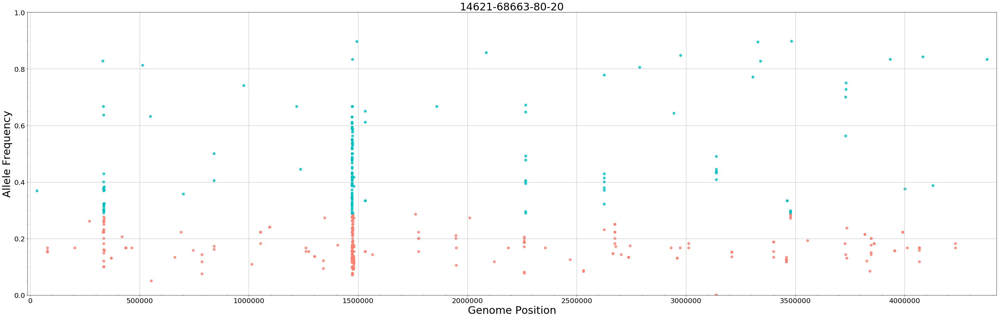

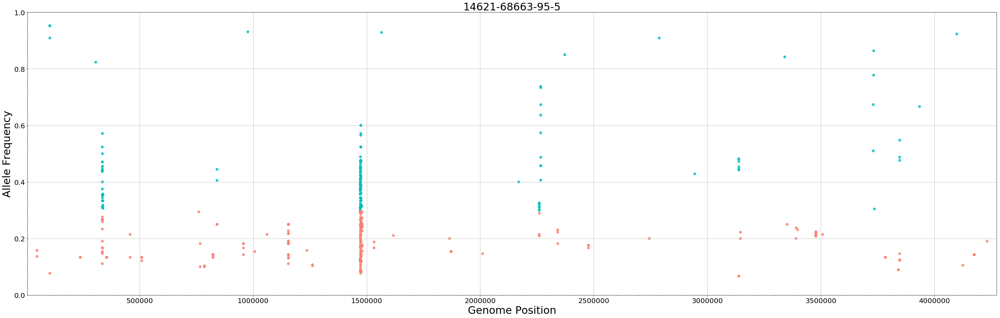

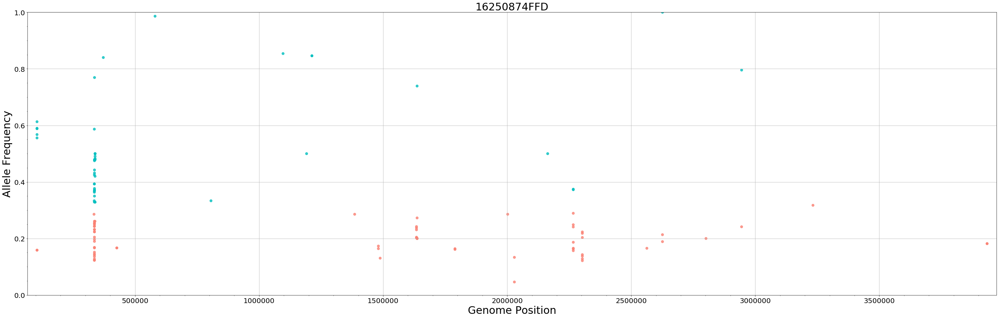

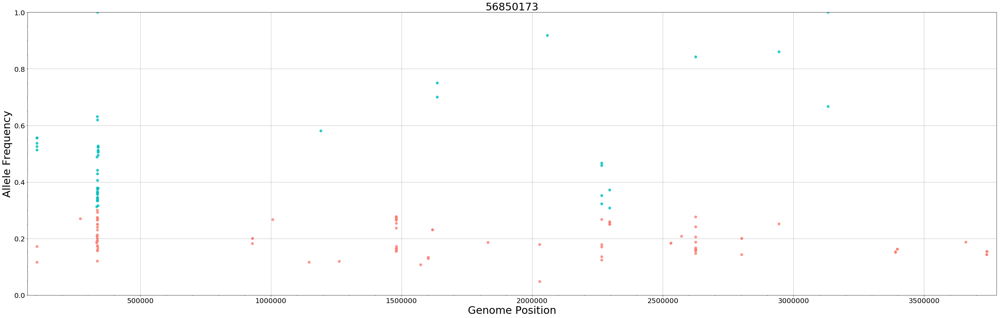

...

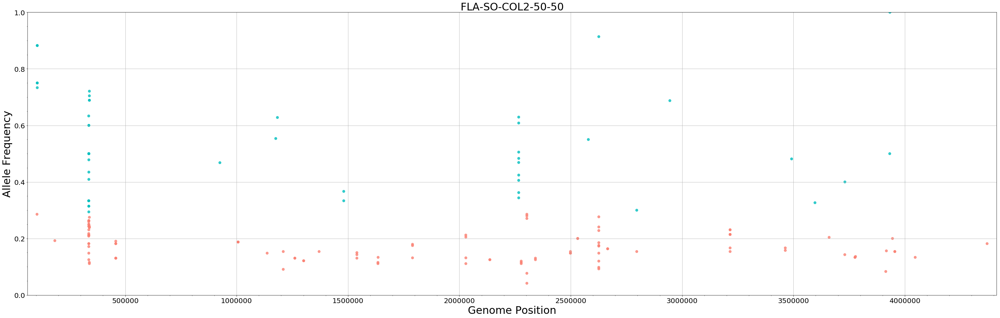

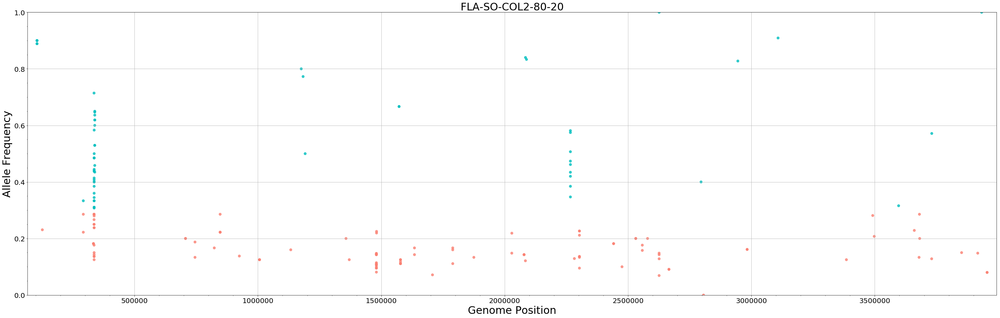

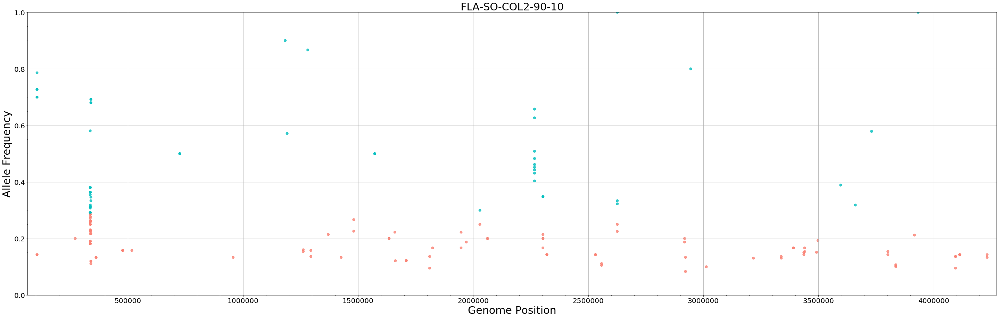

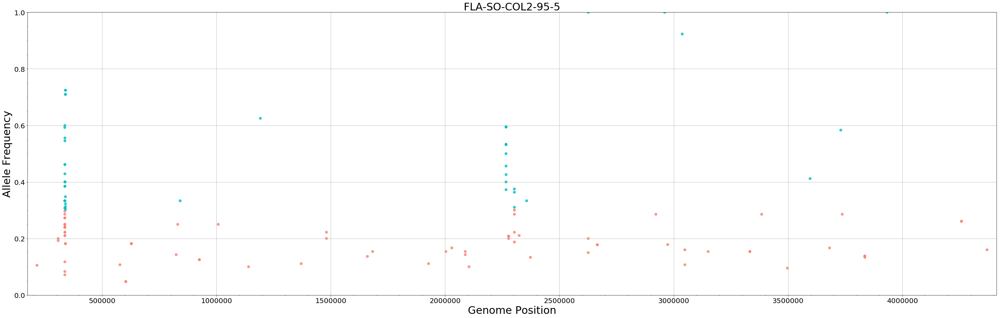

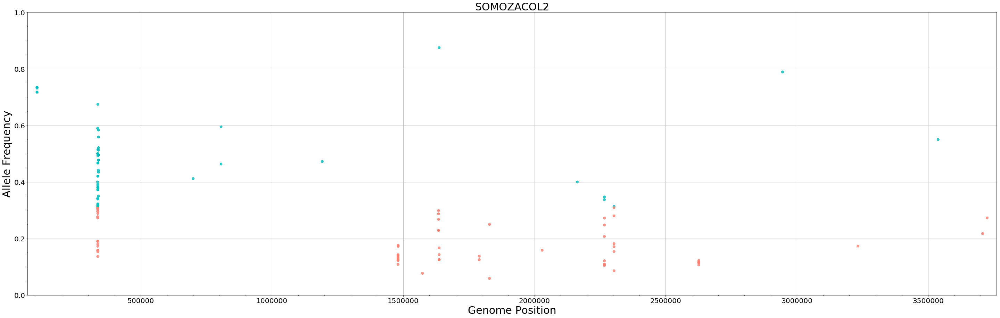

In [107]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

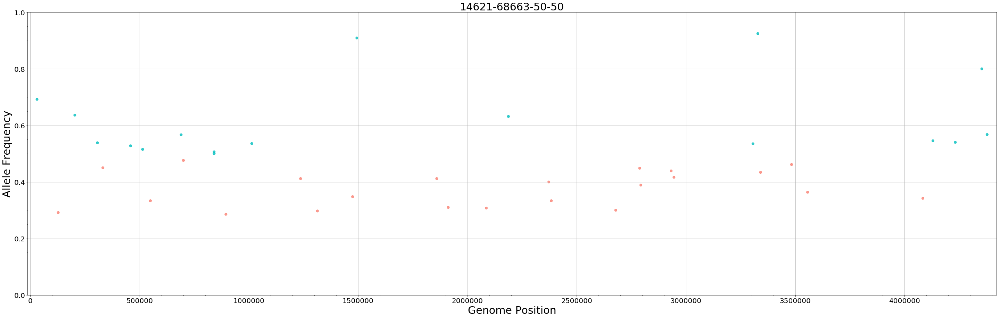

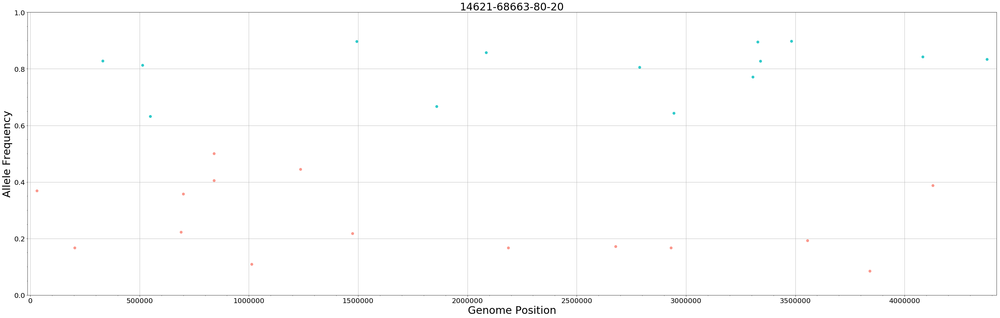

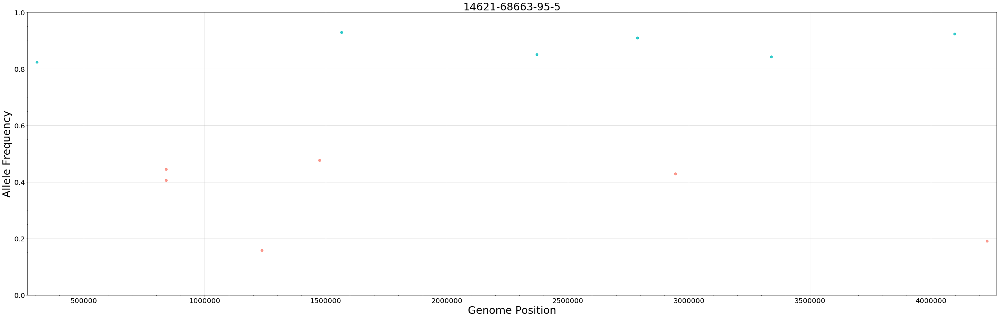

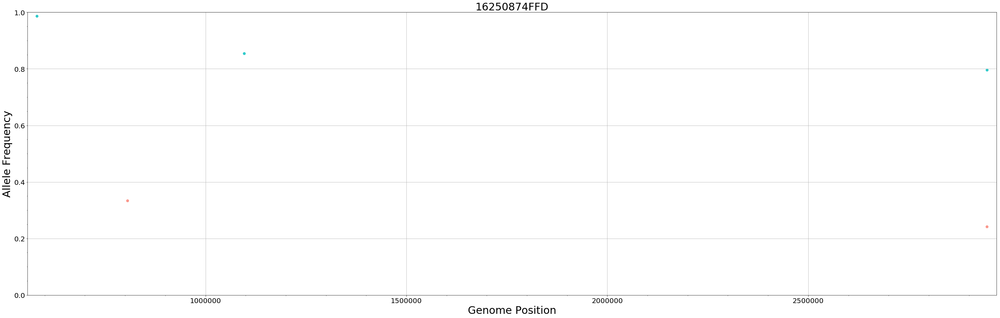

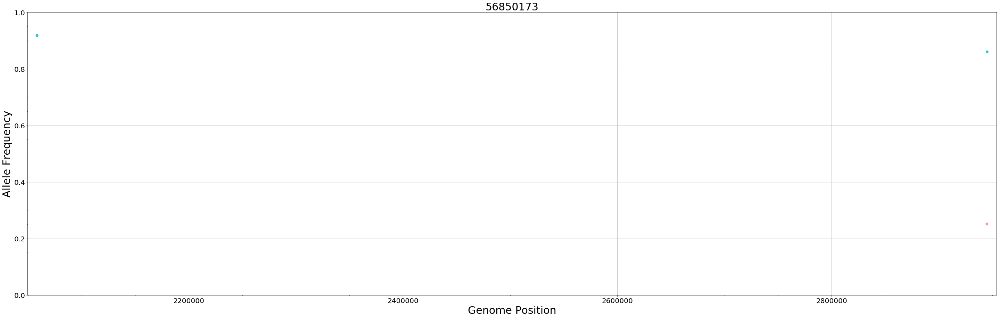

...

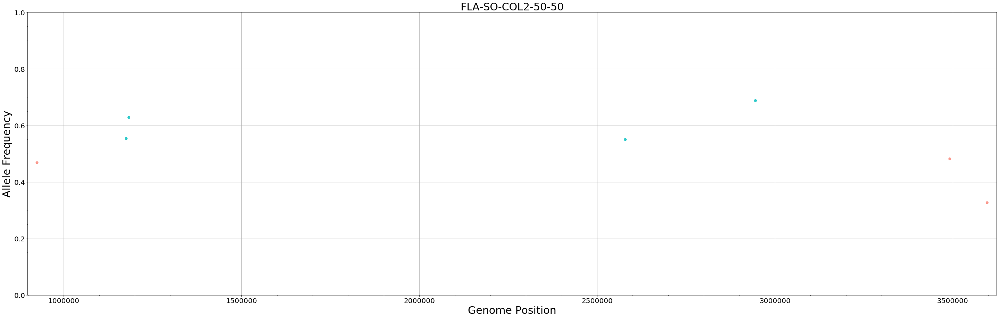

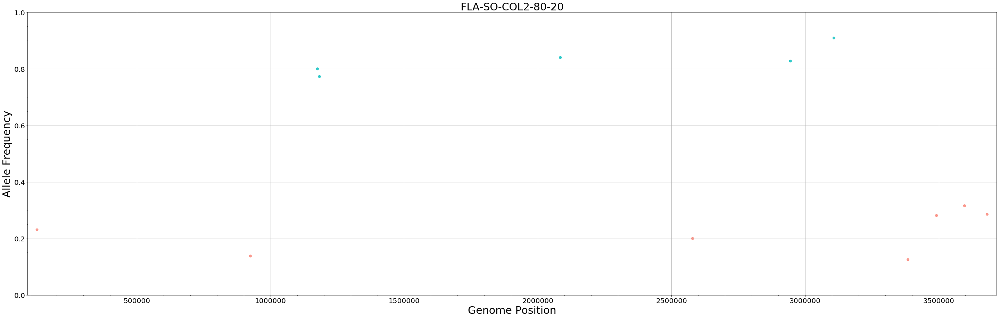

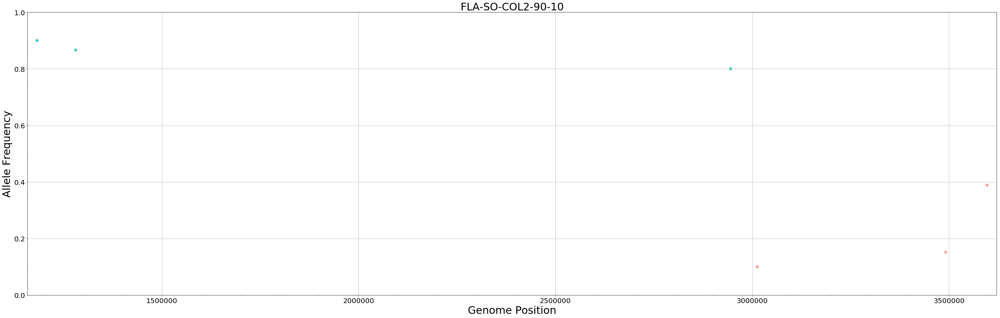

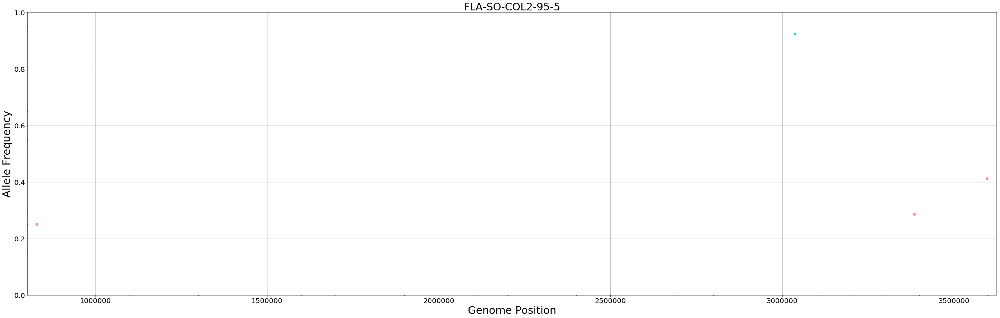

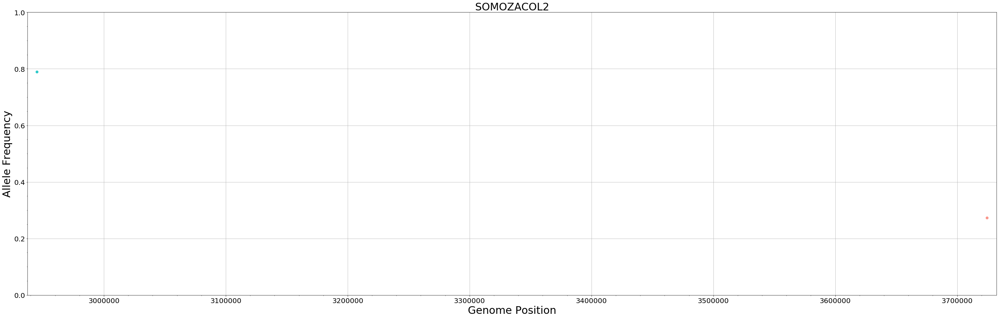

In [112]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

In [113]:
AL68663 = dict_dff['AL68663']
AL68663[(AL68663.AF < 0.6)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
278,MTB_anc,841244,.,C,T,977.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.186e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:70,40:110:99:987,0,2142",1.0,0.5,2.0,110.0,3.0103,4.946,59.20,8.88,1.213,0/1,"70,40",99.0,"987,0,2142",-3.186,-3.857,2.060,NaN,NaN,NaN,2,70.0,40.0,0,1,110.0,0.636364,0.363636,False,1927.0,34.0,1
279,MTB_anc,841278,.,C,T,695.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.756e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:63,26:89:99:705,0,2005",1.0,0.5,2.0,89.0,3.0103,14.429,59.61,7.81,1.304,0/1,"63,26",99.0,"705,0,2005",-1.756,-2.713,-0.582,NaN,NaN,NaN,2,63.0,26.0,0,1,89.0,0.707865,0.292135,False,34.0,42.0,1
294,MTB_anc,895069,.,C,T,863.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.201e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:22,28:50:99:873,0,705",1.0,0.5,2.0,50.0,3.0103,2.447,60.00,17.26,0.886,0/1,"22,28",99.0,"873,0,705",-3.201,0.000,-1.184,NaN,NaN,NaN,2,22.0,28.0,0,1,50.0,0.440000,0.560000,False,181.0,5152.0,1
405,MTB_anc,1313803,.,C,G,1403.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.270e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:33,42:75:99:1413,0,1045",1.0,0.5,2.0,75.0,3.0103,0.000,60.00,18.71,0.728,0/1,"33,42",99.0,"1413,0,1045",-1.270,0.000,0.299,NaN,NaN,NaN,2,33.0,42.0,0,1,75.0,0.440000,0.560000,False,3487.0,14087.0,1
571,MTB_anc,1912315,.,C,T,824.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-4.401e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:47,32:79:99:834,0,1604",1.0,0.5,2.0,79.0,3.0103,3.087,60.00,10.43,1.086,0/1,"47,32",99.0,"834,0,1604",-4.401,0.000,-0.310,NaN,NaN,NaN,2,47.0,32.0,0,1,79.0,0.594937,0.405063,False,5979.0,3822.0,1
626,MTB_anc,2123160,.,C,T,690.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.088e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:49,24:73:99:700,0,1679",1.0,0.5,2.0,73.0,3.0103,3.595,60.00,9.46,1.161,0/1,"49,24",99.0,"700,0,1679",-3.088,0.000,0.247,NaN,NaN,NaN,2,49.0,24.0,0,1,73.0,0.671233,0.328767,False,184.0,5212.0,1
663,MTB_anc,2262403,.,C,A,83.26,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.369e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:5,3:8:93:93,0,186",1.0,0.5,2.0,8.0,3.0103,0.000,40.00,10.41,0.368,0/1,"5,3",93.0,"93,0,186",-2.369,0.000,-0.414,NaN,NaN,NaN,2,5.0,3.0,0,1,8.0,0.625000,0.375000,False,2303.0,2656.0,1
776,MTB_anc,2678606,.,T,C,1181.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=4.89;DP=63;Exc...,GT:AD:DP:GQ:PL,"0/1:28,35:63:99:1191,0,697",1.0,0.5,2.0,63.0,3.0103,0.000,60.00,18.75,0.697,0/1,"28,35",99.0,"1191,0,697",4.890,0.000,0.249,NaN,NaN,NaN,2,28.0,35.0,0,1,63.0,0.444444,0.555556,False,7576.0,2052.0,1
820,MTB_anc,2945042,.,C,G,21316.17,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.77;DP=40;Exc...,GT:AD:DP:GQ:PL,"0/1:25,15:40:99:365,0,1005",1.0,0.5,2.0,40.0,3.0103,25.250,48.04,31.53,0.619,0/1,"25,15",99.0,"365,0,1005",1.770,-1.192,-0.377,NaN,NaN,NaN,2,25.0,15.0,0,1,40.0,0.625000,0.375000,False,13035.0,8265.0,1
982,MTB_anc,3556458,.,T,C,1523.23,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.30;DP=83;Exc...,GT:AD:DP:GQ:PL,"0/1:34,49:83:99:1533,0,948",1.0,0.5,2.0,83.0,3.0103,0.000,60.00,18.35,0.782,0/1,"34,49",99.0,"1533,0,948",2.300,0.000,0.436,NaN,NaN,NaN,2,34.0,49.0,0,1,83.0,0.409639,0.590361,False,183.0,2307.0,1


In [66]:
P1_95 = dict_dff['BUR-PAR-95-5']
P1_95[(P1_95.AF < 0.6) & (P1_95.AF > 0.2)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
575,MTB_anc,2266487,.,G,C,24685.31,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.279;DP=50;Ex...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:24,26:50:99:0|1:2266487_G_C:1008,0,1305:22...",1.0,0.5,2.0,0.279,50.0,51.2979,9.453,-1.0000,59.90,-1.210,16.61,-0.291,1.096,0|1,"24,26",99.0,"1008,0,1305",0|1,2266487_G_C,2266487,2,24.0,26.0,0,1,50.0,0.480000,0.520000,False,1428.0,21.0,1
583,MTB_anc,2266624,.,G,T,18660.31,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.806e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:24,21:45:99:0|1:2266583_C_G:798,0,2265:226...",1.0,0.5,2.0,-1.806,45.0,51.2979,42.467,-1.0000,59.94,-1.001,16.25,0.697,2.573,0|1,"24,21",99.0,"798,0,2265",0|1,2266583_C_G,2266583,2,24.0,21.0,0,1,45.0,0.533333,0.466667,False,20.0,9402.0,1


In [67]:
P2_95 = dict_dff['14621-68663-95-5']
P2_95[(P2_95.AF < 0.6) & (P2_95.AF > 0.4)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
510,MTB_anc,1472849,.,C,G,2909.75,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.49;DP=45;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:23,22:45:99:0|1:1472823_CTGGG_C:978,0,1137...",1.0,0.5,2.0,45.0,3.3775,22.782,-0.0857,60.00,21.40,0.481,0|1,"23,22",99.0,"978,0,1137",2.490,0.000,-0.612,0|1,1472823_CTGGG_C,1472823,2,23.0,22.0,0,1,45.0,0.511111,0.488889,False,37.0,21.0,1
852,MTB_anc,2266487,.,G,C,24685.31,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.279;DP=61;Ex...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:26,35:61:99:0|1:2266487_G_C:1543,0,1229:22...",1.0,0.5,2.0,61.0,51.2979,9.453,-1.0000,59.90,16.61,1.096,0|1,"26,35",99.0,"1543,0,1229",0.279,-1.210,-0.291,0|1,2266487_G_C,2266487,2,26.0,35.0,0,1,61.0,0.426230,0.573770,False,1428.0,21.0,1
860,MTB_anc,2266624,.,G,T,18660.31,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.806e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:20,19:39:99:0|1:2266583_C_G:724,0,1516:226...",1.0,0.5,2.0,39.0,51.2979,42.467,-1.0000,59.94,16.25,2.573,0|1,"20,19",99.0,"724,0,1516",-1.806,-1.001,0.697,0|1,2266583_C_G,2266583,2,20.0,19.0,0,1,39.0,0.512821,0.487179,False,20.0,12483.0,1
1012,MTB_anc,2945042,.,C,G,31013.58,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.351e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:8,6:14:99:132,0,318",1.0,0.5,2.0,14.0,3.3775,14.750,-0.0857,43.21,32.07,0.626,0/1,"8,6",99.0,"132,0,318",-1.351,-0.528,-0.627,NaN,NaN,NaN,2,8.0,6.0,0,1,14.0,0.571429,0.428571,False,17531.0,8265.0,1


In [68]:
P2_95 = dict_dff['14621-68663-95-5']
P2_95[(P2_95.QD < 15)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


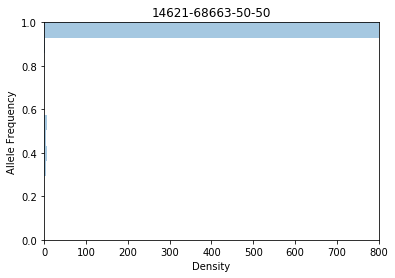

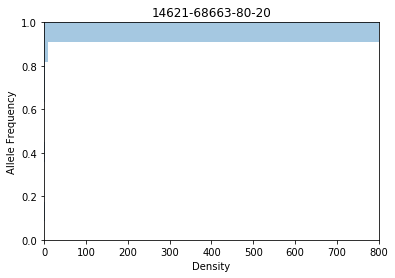

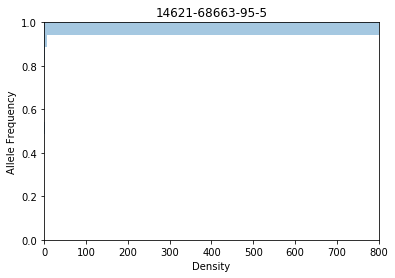

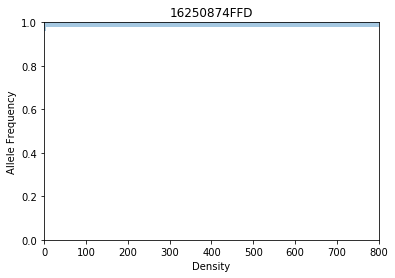

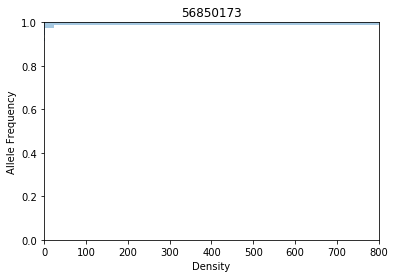

...

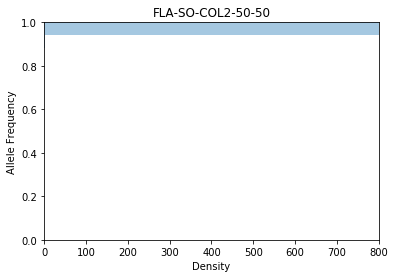

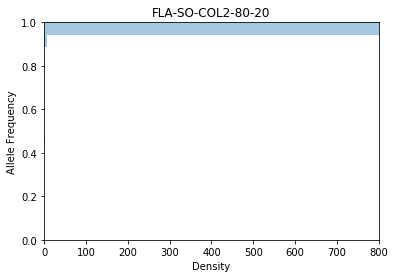

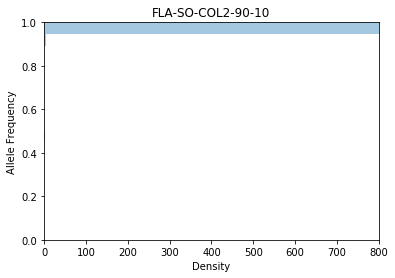

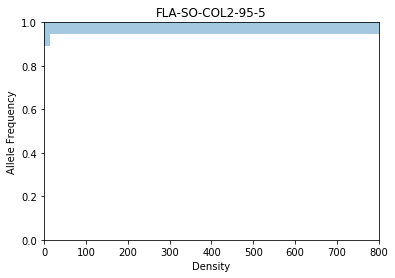

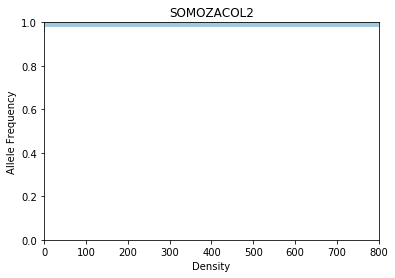

In [69]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [176]:
def split_df_mean(vcf_df, homoz=0.95):
    filter_homoz_top = homoz
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [177]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [178]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

14621-68663-50-50 17 22
14621-68663-80-20 14 15
14621-68663-95-5 6 6
16250874FFD 3 2
56850173 2 1
AL-75607 1 2
AL14621 3 3
AL68663 5 6
BUR-PAR-50-50 277 336
BUR-PAR-80-20 281 293
BUR-PAR-90-10 120 82
BUR-PAR-95-5 47 22
BURGOS89109 1 1
FLA-SO-COL2-50-50 4 3
FLA-SO-COL2-80-20 5 7
FLA-SO-COL2-90-10 3 3
FLA-SO-COL2-95-5 1 3
SOMOZACOL2 1 1


# Create sets for comparing

In [179]:
B = set(dict_dff['BURGOS89109'].POS.values)
P = set(dict_dff['56850173'].POS.values)
A75 = set(dict_dff['AL68663'].POS.values)
A14 = set(dict_dff['AL14621'].POS.values)
F = set(dict_dff['16250874FFD'].POS.values)
S = set(dict_dff['SOMOZACOL2'].POS.values)

In [180]:
B_exclusive = B - P
P_exclusive = P - B
Shared_B_P = P & B
total_difference_B_P = (len(B_exclusive) + len(P_exclusive))
print("B has %s unique positions\n\
P has %s unique positions\n\
Both share %s positions\n\
Total difference: %s" % (len(B_exclusive) , len(P_exclusive), len(Shared_B_P),total_difference_B_P ))

B has 301 unique positions
P has 328 unique positions
Both share 504 positions
Total difference: 629


In [181]:
A75_exclusive = A75 - A14
A14_exclusive = A14 - A75
Shared_A75_A14 = A14 & A75

print("A75 has %s unique positions\n\
A14 has %s unique positions\n\
Both share %s positions" % (len(A75_exclusive) , len(A14_exclusive), len(Shared_A75_A14)))

A75 has 27 unique positions
A14 has 26 unique positions
Both share 848 positions


In [182]:
F_exclusive = F - S
S_exclusive = S - F
Shared_F_S = S & F

print("F has %s unique Positions\n\
S has %s unique Sositions\n\
Both share %s Positions" % (len(F_exclusive) , len(S_exclusive), len(Shared_F_S)))

F has 4 unique Positions
S has 5 unique Sositions
Both share 825 Positions


# Use venn diagram to check disgregation

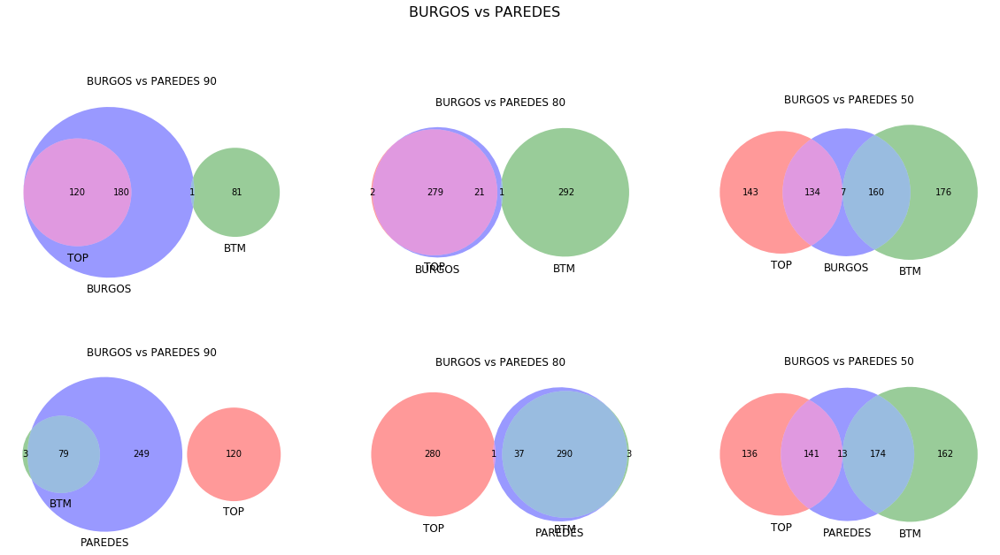

In [183]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['BUR-PAR-90-10'][0]), set(dict_t_b['BUR-PAR-90-10'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 2)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['BUR-PAR-80-20'][0]), set(dict_t_b['BUR-PAR-80-20'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 3)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['BUR-PAR-50-50'][0]), set(dict_t_b['BUR-PAR-50-50'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.suptitle('BURGOS vs PAREDES', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['BUR-PAR-90-10'][0]), set(dict_t_b['BUR-PAR-90-10'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 5)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['BUR-PAR-80-20'][0]), set(dict_t_b['BUR-PAR-80-20'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 6)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['BUR-PAR-50-50'][0]), set(dict_t_b['BUR-PAR-50-50'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

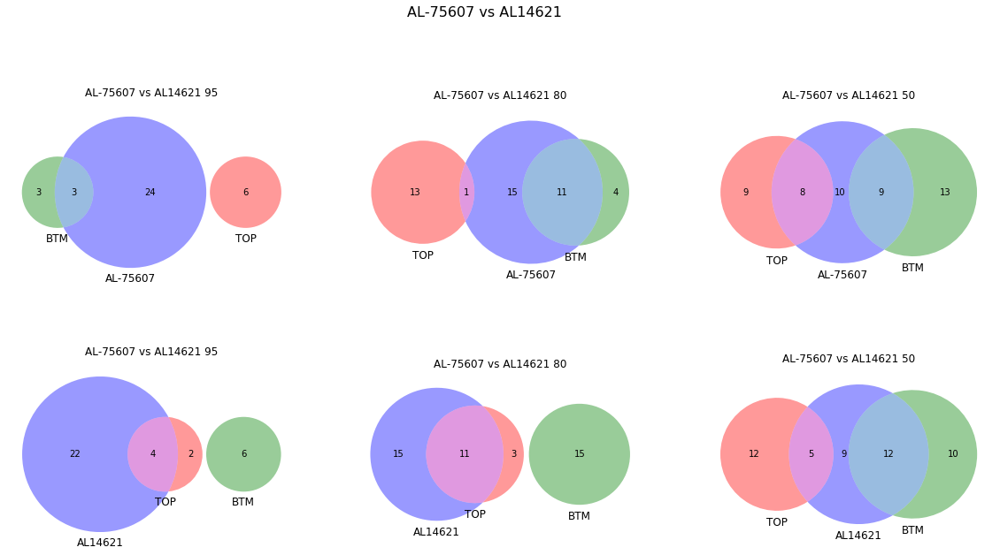

In [184]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("AL-75607 vs AL14621 95")
v3 = venn3([set(dict_t_b['14621-68663-95-5'][0]), set(dict_t_b['14621-68663-95-5'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 2)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['14621-68663-80-20'][0]), set(dict_t_b['14621-68663-80-20'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 3)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['14621-68663-50-50'][0]), set(dict_t_b['14621-68663-50-50'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.suptitle('AL-75607 vs AL14621', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("AL-75607 vs AL14621 95")
v3 = venn3([set(dict_t_b['14621-68663-95-5'][0]), set(dict_t_b['14621-68663-95-5'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 5)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['14621-68663-80-20'][0]), set(dict_t_b['14621-68663-80-20'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 6)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['14621-68663-50-50'][0]), set(dict_t_b['14621-68663-50-50'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

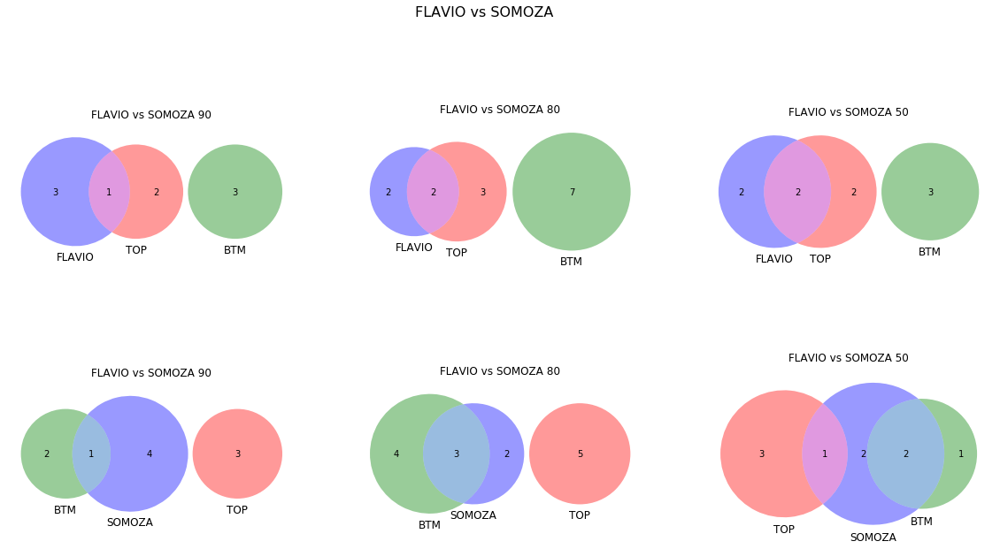

In [185]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-90-10'][0]), set(dict_t_b['FLA-SO-COL2-90-10'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 2)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-80-20'][0]), set(dict_t_b['FLA-SO-COL2-80-20'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 3)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-50-50'][0]), set(dict_t_b['FLA-SO-COL2-50-50'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.suptitle('FLAVIO vs SOMOZA', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-90-10'][0]), set(dict_t_b['FLA-SO-COL2-90-10'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 5)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-80-20'][0]), set(dict_t_b['FLA-SO-COL2-80-20'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 6)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['FLA-SO-COL2-50-50'][0]), set(dict_t_b['FLA-SO-COL2-50-50'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

In [124]:
dict_vcf['FLA-SO-COL2-80-20'][dict_vcf['FLA-SO-COL2-80-20'].POS.isin(S_exclusive)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
269,MTB_anc,924872,.,C,T,664.87,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-5.580e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:25,4:29:43:43,0,942",1.0,0.5,2.0,29.0,3.1293,0.907,-0.0583,60.0,8.75,0.836,0/1,"25,4",43.0,"43,0,942",-0.558,0.0,2.330,NaN,NaN,NaN,2,25.0,4.0,0,1,29.0,0.862069,0.137931,False,11598.0,6251.0,1
700,MTB_anc,2579208,.,G,T,1004.84,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.736e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:40,10:50:99:210,0,1471",1.0,0.5,2.0,50.0,3.1293,2.541,-0.0573,60.0,9.13,1.018,0/1,"40,10",99.0,"210,0,1471",-2.736,0.0,0.620,NaN,NaN,NaN,2,40.0,10.0,0,1,50.0,0.800000,0.200000,False,582.0,1901.0,1
892,MTB_anc,3491767,.,C,T,2259.75,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.303e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:69,27:96:99:638,0,2369",1.0,0.5,2.0,96.0,3.3775,0.468,-0.0857,60.0,7.79,0.633,0/1,"69,27",99.0,"638,0,2369",-3.303,0.0,0.232,NaN,NaN,NaN,2,69.0,27.0,0,1,96.0,0.718750,0.281250,False,7755.0,6054.0,1


In [122]:
dict_vcf['SOMOZACOL2'][dict_vcf['SOMOZACOL2'].POS.isin(S_exclusive)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
278,MTB_anc,924872,.,C,T,5141.18,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=0.523;DP=130;Ex...,GT:AD:DP:GQ:PL,"1/1:0,130:130:99:4419,389,0",2.0,1.0,2.0,130.0,0.3892,0.995,0.4375,60.00,19.70,0.779,1/1,"0,130",99.0,"4419,389,0",0.523,0.0,0.958,NaN,NaN,NaN,2,0.0,130.0,1,1,130.0,0.000000,1.000000,False,8826.0,4222.0,1
374,MTB_anc,1259011,.,C,T,2527.10,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-2.907e+00;DP=6...,GT:AD:DP:GQ:PL,"1/1:0,66:66:99:2105,193,0",2.0,1.0,2.0,66.0,1.6913,3.224,0.2000,60.00,16.63,0.929,1/1,"0,66",99.0,"2105,193,0",-2.907,0.0,0.824,NaN,NaN,NaN,2,0.0,66.0,1,1,66.0,0.000000,1.000000,False,4449.0,16946.0,1
727,MTB_anc,2579208,.,G,T,4831.35,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-1.942e+00;DP=1...,GT:AD:DP:GQ:PL,"1/1:1,116:117:99:3645,338,0",2.0,1.0,2.0,117.0,0.3892,10.173,0.4234,60.00,20.39,0.721,1/1,"1,116",99.0,"3645,338,0",-1.942,0.0,0.232,NaN,NaN,NaN,2,1.0,116.0,1,1,117.0,0.008547,0.991453,False,582.0,1901.0,1
936,MTB_anc,3491767,.,C,T,9956.35,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-3.102e+00;DP=2...,GT:AD:DP:GQ:PL,"1/1:0,212:212:99:7103,634,0",2.0,1.0,2.0,212.0,0.6695,0.550,0.3029,59.99,19.99,0.639,1/1,"0,212",99.0,"7103,634,0",-3.102,0.0,-0.702,NaN,NaN,NaN,2,0.0,212.0,1,1,212.0,0.000000,1.000000,False,7755.0,6510.0,1
979,MTB_anc,3724564,.,G,C,86.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.023;DP=11;Ex...,GT:AD:DP:GQ:PL,"0/1:8,3:11:90:90,0,339",1.0,0.5,2.0,11.0,10.5508,22.175,-0.2759,60.00,7.83,2.773,0/1,"8,3",90.0,"90,0,339",0.023,0.0,-0.542,NaN,NaN,NaN,2,8.0,3.0,0,1,11.0,0.727273,0.272727,False,16975.0,5763.0,1


In [123]:
S_exclusive

{924872, 1259011, 2579208, 3491767, 3724564}

In [95]:
print(dict_vcf.keys())

dict_keys(['14621-68663-50-50', '14621-68663-80-20', '14621-68663-95-5', '16250874FFD', '56850173', 'AL-75607', 'AL14621', 'AL68663', 'BUR-PAR-50-50', 'BUR-PAR-80-20', 'BUR-PAR-90-10', 'BUR-PAR-95-5', 'BURGOS89109', 'FLA-SO-COL2-50-50', 'FLA-SO-COL2-80-20', 'FLA-SO-COL2-90-10', 'FLA-SO-COL2-95-5', 'SOMOZACOL2'])


# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [136]:
dict_dff['BUR-PAR-50-50'].describe()

,POS,QUAL,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GQ,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.109000e+03,1109.000000,1109.000000,1109.000000,1109.0,747.000000,1109.000000,1109.000000,1109.000000,1109.000000,747.000000,1109.000000,745.000000,1109.000000,1109.000000,1109.0,1109.000000,1109.000000,1109.000000,1109.0,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.0
mean,2.188356e+06,15085.774220,1.447250,0.723625,2.0,-0.047837,37.743913,1.306617,1.853638,59.903012,0.015811,29.347069,0.259816,0.747921,94.392245,2.0,10.435528,27.297565,0.447250,1.0,37.733093,0.275941,0.724059,3454.816952,3473.873760,1.0
std,1.324741e+06,11415.553072,0.497434,0.248717,0.0,1.890920,14.365876,1.467725,3.151074,0.981074,0.295746,3.838824,0.852811,0.325809,12.025784,0.0,11.228214,14.636813,0.497434,0.0,14.360652,0.260114,0.260114,3783.714319,3613.752999,0.0
min,1.977000e+03,64.860000,1.000000,0.500000,2.0,-4.507000,4.000000,0.000300,0.000000,43.210000,-1.174000,6.750000,-2.438000,0.067000,15.000000,2.0,0.000000,2.000000,0.000000,1.0,4.000000,0.000000,0.132075,26.000000,26.000000,1.0
25%,1.055049e+06,5423.090000,1.000000,0.500000,2.0,-1.665500,28.000000,0.007600,0.000000,60.000000,0.000000,27.060000,-0.314000,0.534000,99.000000,2.0,0.000000,17.000000,0.000000,1.0,28.000000,0.000000,0.490566,924.000000,955.000000,1.0
50%,2.154724e+06,12053.300000,1.000000,0.500000,2.0,-0.141000,36.000000,0.075300,0.000000,60.000000,0.000000,29.470000,0.249000,0.735000,99.000000,2.0,10.000000,24.000000,0.000000,1.0,36.000000,0.360656,0.639344,2152.000000,2307.000000,1.0
75%,3.326554e+06,22270.340000,2.000000,1.000000,2.0,1.680000,46.000000,3.010300,2.736000,60.000000,0.000000,32.050000,0.818000,0.900000,99.000000,2.0,18.000000,36.000000,1.000000,1.0,46.000000,0.509434,1.000000,4729.000000,4848.000000,1.0
max,4.408156e+06,74418.320000,2.000000,1.000000,2.0,4.910000,109.000000,4.878900,23.313000,60.000000,6.930000,37.920000,2.830000,2.936000,99.000000,2.0,58.000000,106.000000,1.000000,1.0,107.000000,0.867925,1.000000,31715.000000,31041.000000,1.0


/home/laura/env36/lib/python3.6/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


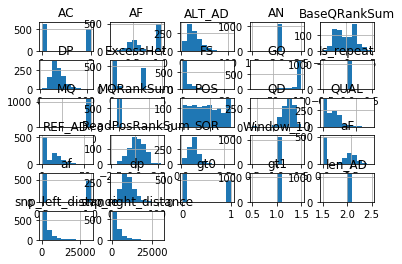

In [137]:
dict_dff['BUR-PAR-50-50'].hist()
plt.show()

In [138]:
def assign_group_P1(row):
    if row.POS in B_exclusive:
        return 1
    elif row.POS in P_exclusive:
        return 2
    else:
        return 3


In [139]:
def assign_group_P2(row):
    if row.POS in A75_exclusive:
        return 1
    elif row.POS in A14_exclusive:
        return 2
    else:
        return 3


In [164]:
Atest5 = dict_dff['14621-68663-50-50'][(dict_dff['14621-68663-50-50'].AC != 2) & (dict_dff['14621-68663-50-50'].gt0 != 1)]
Atest8 = dict_dff['14621-68663-80-20'][(dict_dff['14621-68663-80-20'].AC != 2) & (dict_dff['14621-68663-80-20'].gt0 != 1)]
Atest95 = dict_dff['14621-68663-95-5'][(dict_dff['14621-68663-95-5'].AC != 2) & (dict_dff['14621-68663-95-5'].gt0 != 1)]


Ktest5 = dict_dff['BUR-PAR-50-50'][(dict_dff['BUR-PAR-50-50'].AC != 2) & (dict_dff['BUR-PAR-50-50'].gt0 != 1)]
Ktest8 = dict_dff['BUR-PAR-80-20'][(dict_dff['BUR-PAR-80-20'].AC != 2) & (dict_dff['BUR-PAR-80-20'].gt0 != 1)]
Ktest9 = dict_dff['BUR-PAR-90-10'][(dict_dff['BUR-PAR-90-10'].AC != 2) & (dict_dff['BUR-PAR-90-10'].gt0 != 1)]
Ktest95 = dict_dff['BUR-PAR-95-5'][(dict_dff['BUR-PAR-95-5'].AC != 2) & (dict_dff['BUR-PAR-95-5'].gt0 != 1)]

In [165]:
print(dict_dff.keys())

dict_keys(['14621-68663-50-50', '14621-68663-80-20', '14621-68663-95-5', '16250874FFD', '56850173', 'AL-75607', 'AL14621', 'AL68663', 'BUR-PAR-50-50', 'BUR-PAR-80-20', 'BUR-PAR-90-10', 'BUR-PAR-95-5', 'BURGOS89109', 'FLA-SO-COL2-50-50', 'FLA-SO-COL2-80-20', 'FLA-SO-COL2-90-10', 'FLA-SO-COL2-95-5', 'SOMOZACOL2'])


In [166]:
Ktest5.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
0,MTB_anc,1977,.,G,A,8943.77,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.703e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:17,30:47:99:802,0,496",1.0,0.5,2.0,-1.703,47.0,0.0034,0.000,0.7564,60.0,0.0,29.52,0.653,0.768,0/1,"17,30",99.0,"802,0,496",NaN,NaN,NaN,2,17.0,30.0,0,1,47.0,0.361702,0.638298,False,1977.0,555.0,1
2,MTB_anc,6140,.,G,T,17522.05,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.68;DP=85;Exc...,GT:AD:DP:GQ:PL,"0/1:43,42:85:99:1193,0,1221",1.0,0.5,2.0,1.680,85.0,0.0076,0.000,0.7286,60.0,0.0,27.21,-0.685,0.630,0/1,"43,42",99.0,"1193,0,1221",NaN,NaN,NaN,2,43.0,42.0,0,1,85.0,0.505882,0.494118,False,3608.0,1445.0,1
3,MTB_anc,7585,.,C,G,11259.09,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.23;DP=59;Exc...,GT:AD:DP:GQ:PL,"0/1:35,24:59:99:694,0,1054",1.0,0.5,2.0,1.230,59.0,0.0267,13.833,0.6162,60.0,0.0,30.51,0.802,0.672,0/1,"35,24",99.0,"694,0,1054",NaN,NaN,NaN,2,35.0,24.0,0,1,59.0,0.593220,0.406780,False,1445.0,1558.0,1
5,MTB_anc,9304,.,A,G,7504.71,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.73;DP=42;Exc...,GT:AD:DP:GQ:PL,"0/1:19,23:42:99:625,0,481",1.0,0.5,2.0,1.730,42.0,0.0034,1.556,0.7081,60.0,0.0,31.14,0.434,0.630,0/1,"19,23",99.0,"625,0,481",NaN,NaN,NaN,2,19.0,23.0,0,1,42.0,0.452381,0.547619,False,161.0,1437.0,1
6,MTB_anc,10741,.,C,G,8147.77,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.499;DP=36;Ex...,GT:AD:DP:GQ:PL,"0/1:22,14:36:99:403,0,685",1.0,0.5,2.0,0.499,36.0,0.0034,6.343,0.7563,60.0,0.0,33.12,-0.065,0.316,0/1,"22,14",99.0,"403,0,685",NaN,NaN,NaN,2,22.0,14.0,0,1,36.0,0.611111,0.388889,False,1437.0,2719.0,1


In [167]:
Atest5['category'] = Atest5.apply(assign_group_P2, axis=1)
Atest8['category'] = Atest8.apply(assign_group_P2, axis=1)
Atest95['category'] = Atest95.apply(assign_group_P2, axis=1)


Ktest5['category'] = Ktest5.apply(assign_group_P1, axis=1)
Ktest8['category'] = Ktest8.apply(assign_group_P1, axis=1)
Ktest9['category'] = Ktest9.apply(assign_group_P1, axis=1)
Ktest95['category'] = Ktest95.apply(assign_group_P1, axis=1)

/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [168]:
Ktest5[Ktest5.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
306,MTB_anc,746633,.,G,T,64.86,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.00;DP=4;Exce...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:2,2:4:78:0|1:746633_G_T:78,0,460:746633",1.0,0.5,2.0,0.000,4.0,3.1231,0.000,-0.0524,60.00,0.0,16.21,-0.792,0.818,0|1,"2,2",78.0,"78,0,460",0|1,746633_G_T,746633,2,2.0,2.0,0,1,4.0,0.500000,0.500000,False,9923.0,3136.0,1,3
330,MTB_anc,821907,.,C,T,17855.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.78;DP=25;Exc...,GT:AD:DP:GQ:PL,"0/1:2,23:25:15:742,0,15",1.0,0.5,2.0,1.780,25.0,3.0103,0.000,-0.0262,60.00,0.0,34.14,0.727,0.455,0/1,"2,23",15.0,"742,0,15",NaN,NaN,NaN,2,2.0,23.0,0,1,25.0,0.080000,0.920000,False,1155.0,10294.0,1,3
471,MTB_anc,1253071,.,C,A,1361.39,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.575e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:46,7:53:81:81,0,1344",1.0,0.5,2.0,-1.575,53.0,3.7667,11.986,-0.1176,60.00,0.0,7.24,0.985,0.246,0/1,"46,7",81.0,"81,0,1344",NaN,NaN,NaN,2,46.0,7.0,0,1,53.0,0.867925,0.132075,False,907.0,580.0,1,3
533,MTB_anc,1441533,.,C,G,3156.83,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.587;DP=17;Ex...,GT:AD:DP:GQ:PL,"0/1:6,11:17:99:246,0,203",1.0,0.5,2.0,0.587,17.0,0.0060,3.579,0.7507,59.17,0.0,32.21,1.510,1.075,0/1,"6,11",99.0,"246,0,203",NaN,NaN,NaN,2,6.0,11.0,0,1,17.0,0.352941,0.647059,False,13027.0,3941.0,1,3


In [170]:
Atest5 = Atest5[Atest5.category != 3]
Atest8 = Atest8[Atest8.category != 3]
Atest95 = Atest95[Atest95.category != 3]


Ktest5 = Ktest5[Ktest5.category != 3]
Ktest8 = Ktest8[Ktest8.category != 3]
Ktest9 = Ktest9[Ktest9.category != 3]
Ktest95 = Ktest95[Ktest95.category != 3]

In [171]:
Ktest8.gt0[Ktest8.category == 1].value_counts()

0    280
Name: gt0, dtype: int64

In [172]:
Atest8.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,InbreedingCoeff,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
14,MTB_anc,30879,.,T,C,1096.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.61;DP=19;Exc...,GT:AD:DP:GQ:PL,"0/1:12,7:19:99:208,0,319",1.0,0.5,2.0,19.0,3.1293,2.250,-0.0556,60.0,18.91,1.085,0/1,"12,7",99.0,"208,0,319",2.610,0.0,-0.127,NaN,NaN,NaN,2,12.0,7.0,0,1,19.0,0.631579,0.368421,False,3410.0,5659.0,1,1
59,MTB_anc,203868,.,C,A,686.57,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-4.310e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:5,1:6:21:21,0,182",1.0,0.5,2.0,6.0,3.3579,0.000,-0.0714,60.0,20.81,0.593,0/1,"5,1",21.0,"21,0,182",-0.431,0.0,-0.210,NaN,NaN,NaN,2,5.0,1.0,0,1,6.0,0.833333,0.166667,False,1972.0,2613.0,1,1
87,MTB_anc,332186,.,G,T,2254.37,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.317e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:5,24:29:99:698,0,122",1.0,0.5,2.0,29.0,0.3672,6.580,0.4412,60.0,22.77,1.533,0/1,"5,24",99.0,"698,0,122",-3.317,0.0,0.318,NaN,NaN,NaN,2,5.0,24.0,0,1,29.0,0.172414,0.827586,False,598.0,941.0,1,2
188,MTB_anc,514131,.,G,T,2080.37,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.951e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:6,26:32:99:692,0,123",1.0,0.5,2.0,32.0,0.3672,0.891,0.4412,60.0,21.67,0.556,0/1,"6,26",99.0,"692,0,123",-1.951,0.0,-1.329,NaN,NaN,NaN,2,6.0,26.0,0,1,32.0,0.187500,0.812500,False,8157.0,526.0,1,2
200,MTB_anc,549592,.,C,T,2385.37,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.834e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:14,24:38:99:658,0,452",1.0,0.5,2.0,38.0,0.3672,0.000,0.4409,60.0,18.07,0.734,0/1,"14,24",99.0,"658,0,452",-1.834,0.0,0.434,NaN,NaN,NaN,2,14.0,24.0,0,1,38.0,0.368421,0.631579,False,3235.0,1933.0,1,2


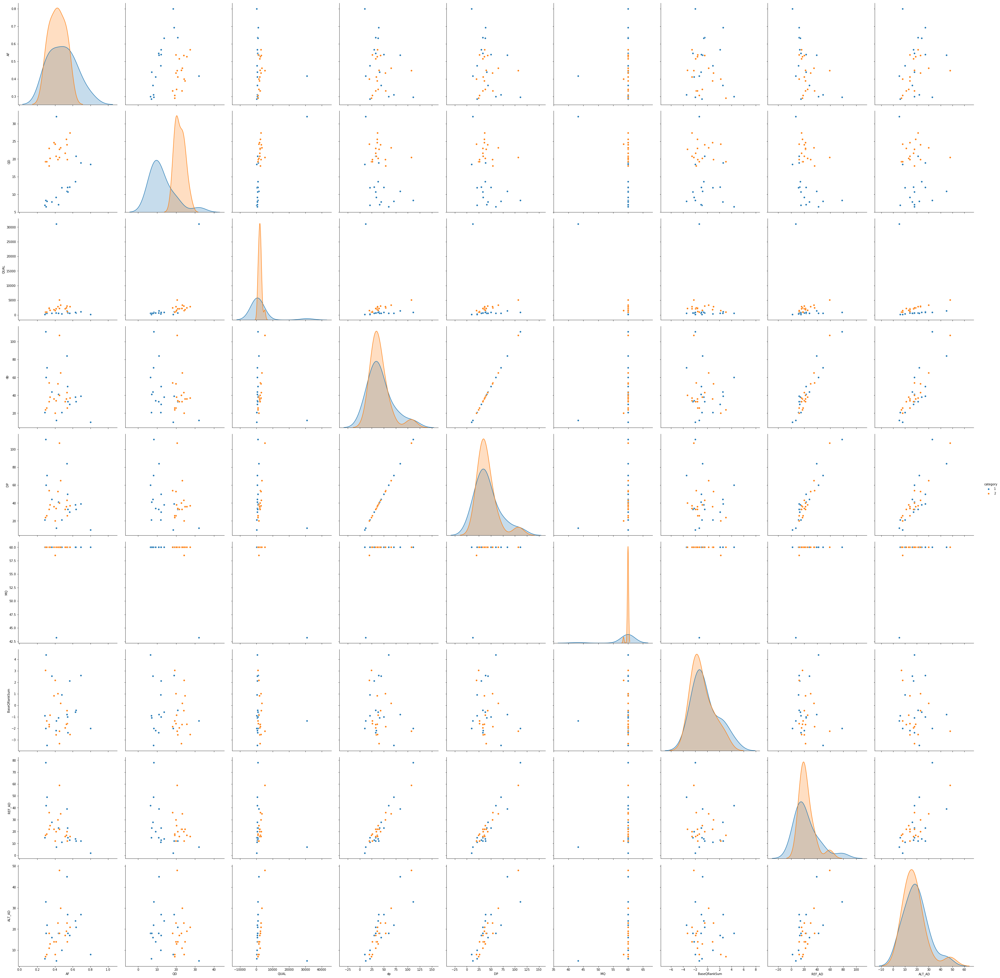

In [173]:
sns.pairplot(Atest5, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum","REF_AD", "ALT_AD"],kind='scatter')

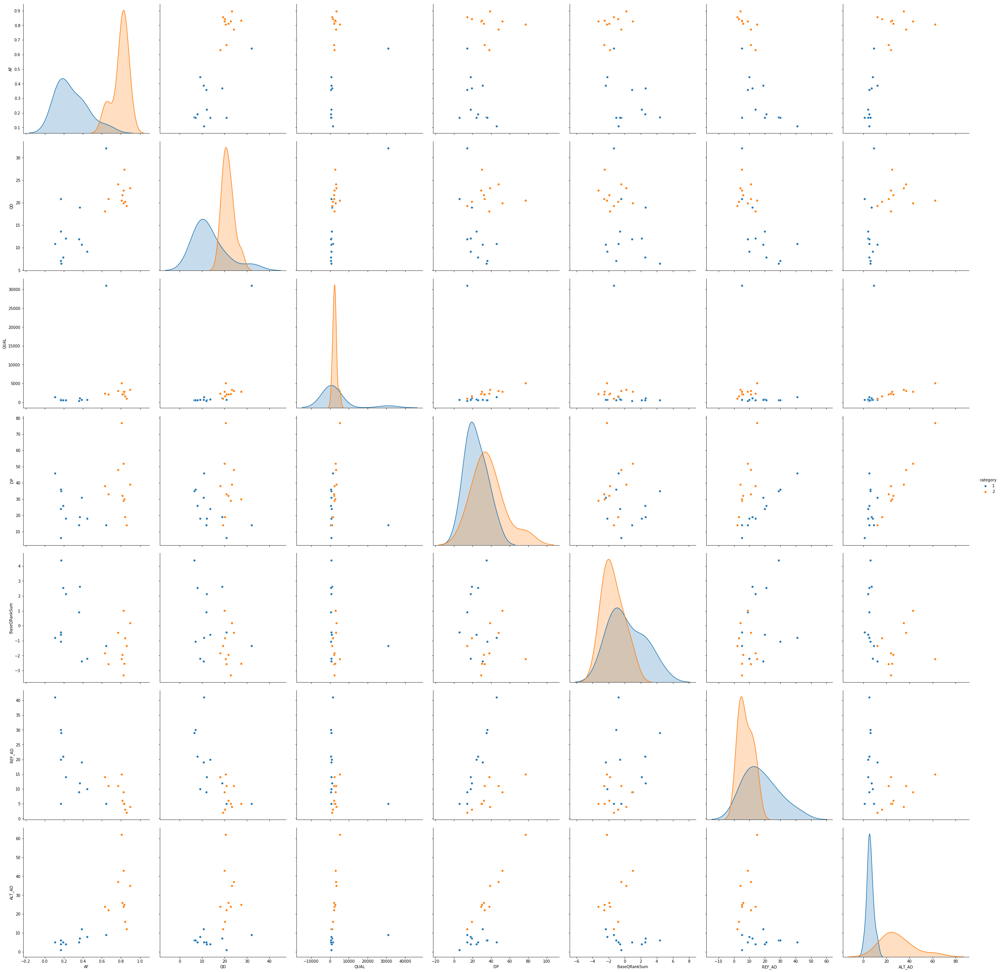

In [153]:
sns.pairplot(Atest8, hue='category',size=5,vars=["AF","QD", "QUAL","DP", "BaseQRankSum","REF_AD", "ALT_AD"],kind='scatter')

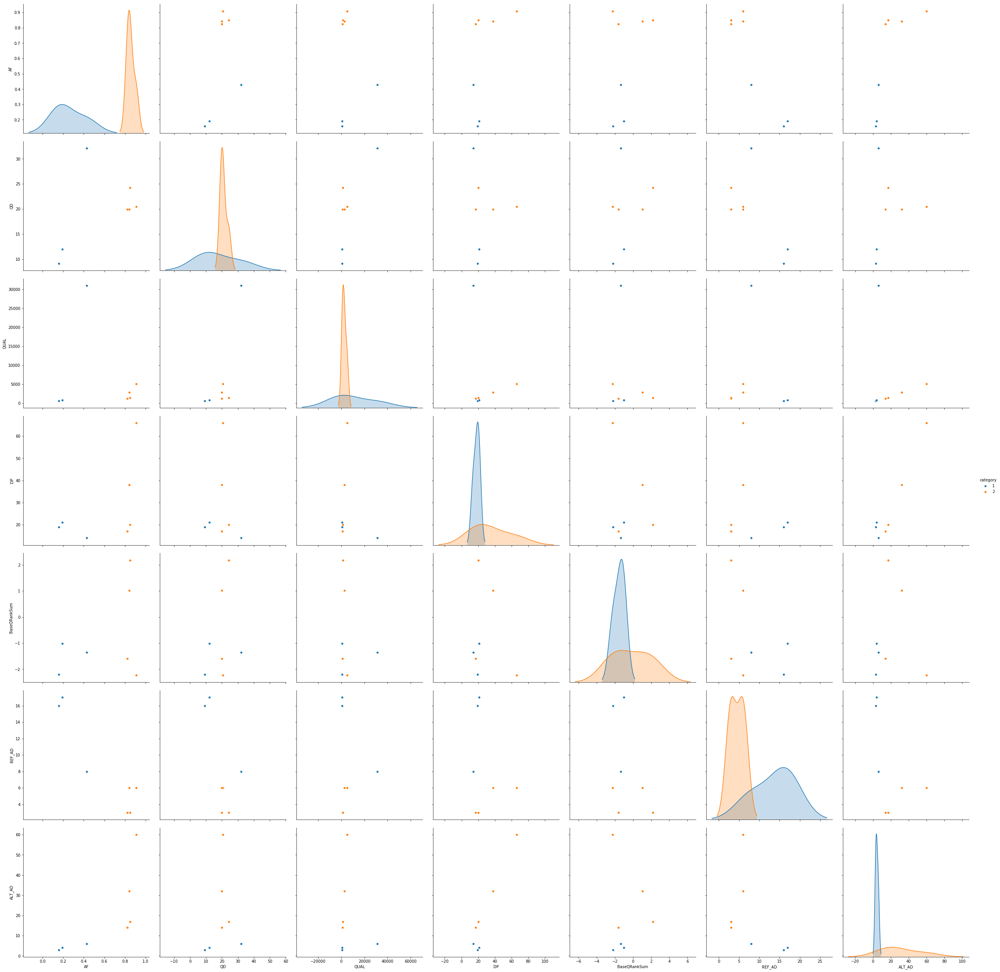

In [186]:
sns.pairplot(Atest95, hue='category',size=5,vars=["AF","QD", "QUAL","DP", "BaseQRankSum","REF_AD", "ALT_AD"],kind='scatter')

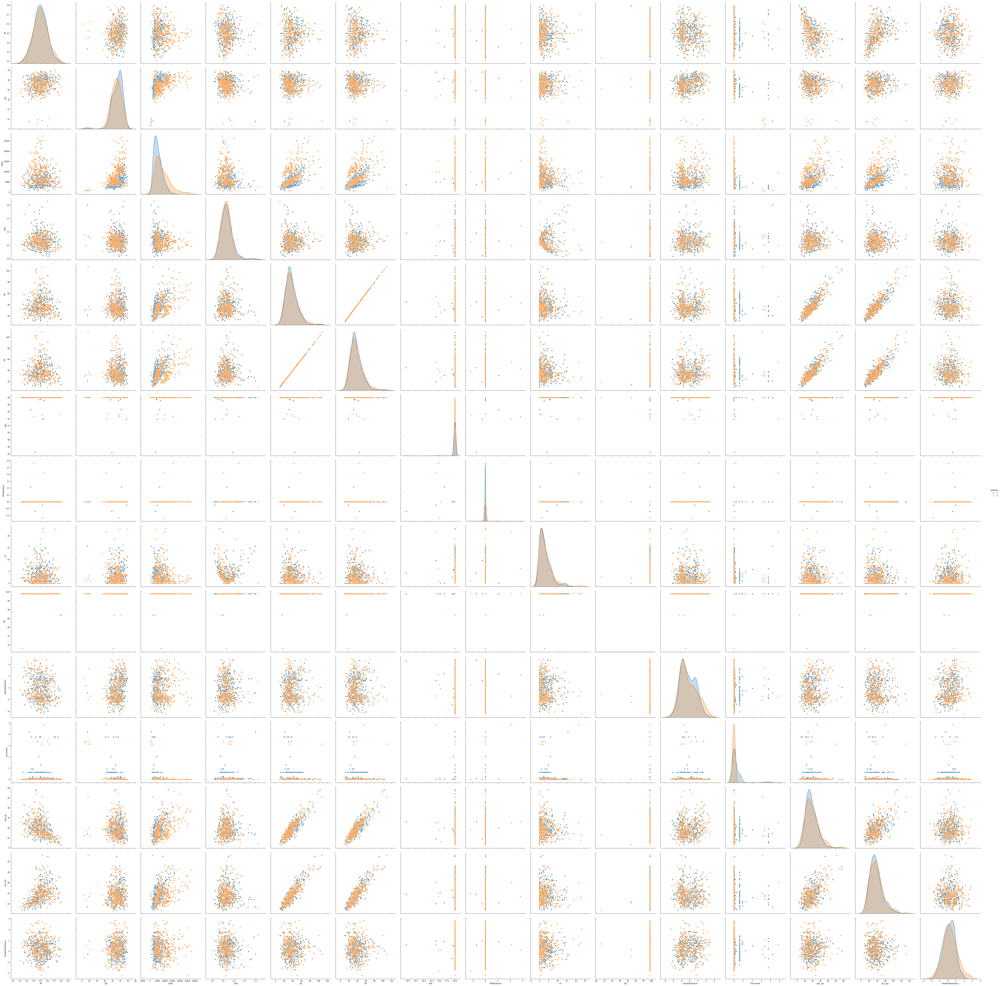

In [195]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

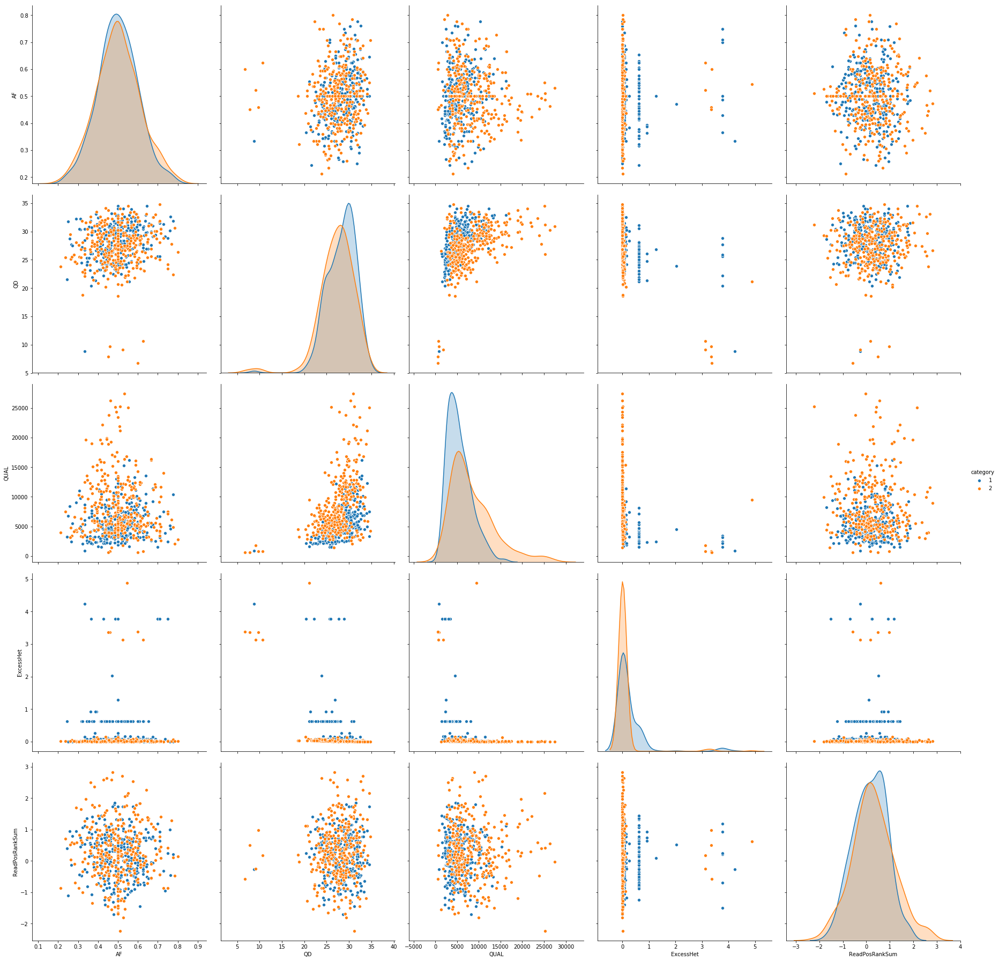

In [163]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "ExcessHet", "ReadPosRankSum"],kind='scatter')

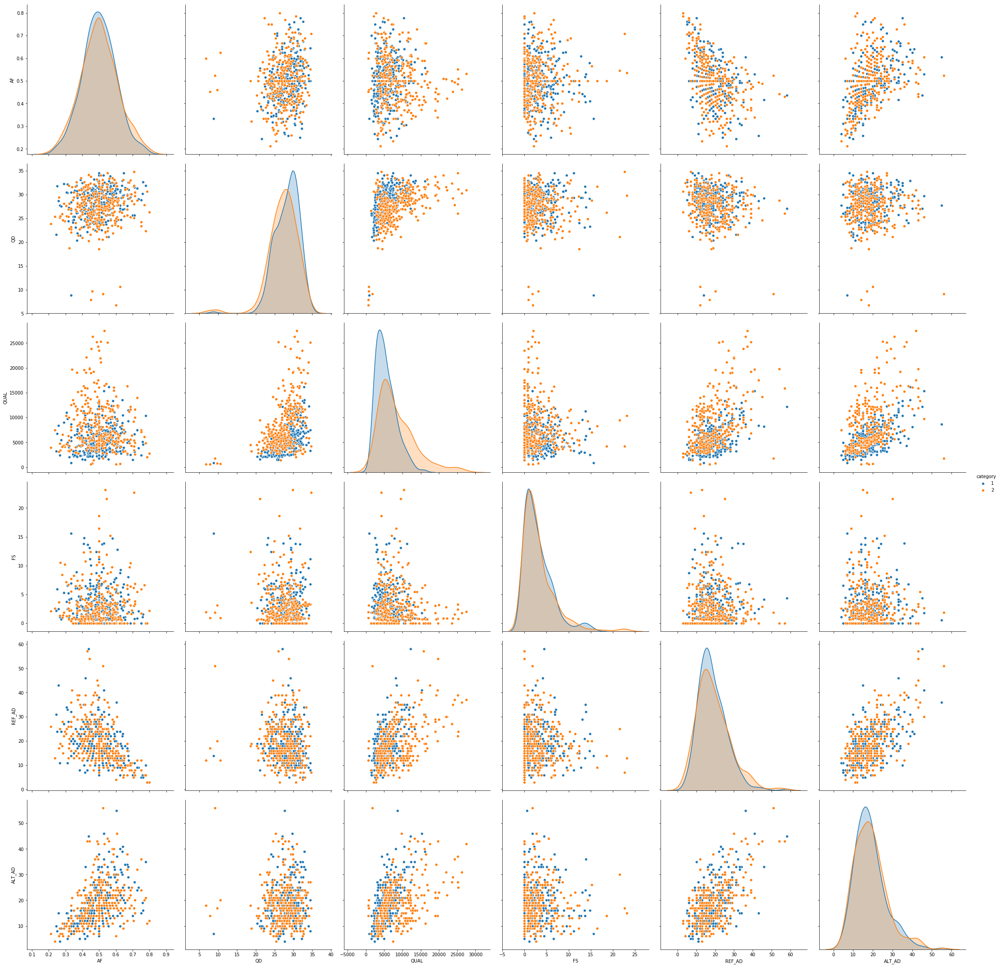

In [155]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "FS","REF_AD", "ALT_AD"],kind='scatter')

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


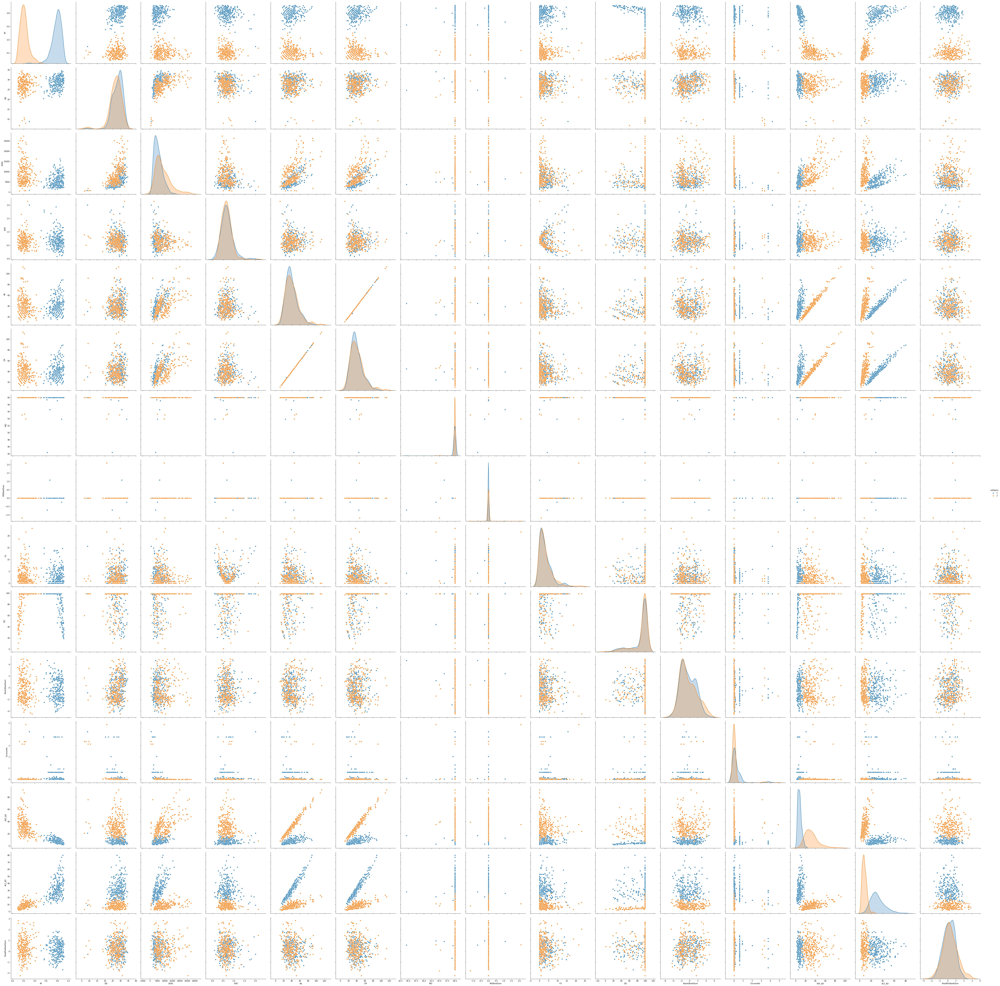

In [194]:
sns.pairplot(Ktest8, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

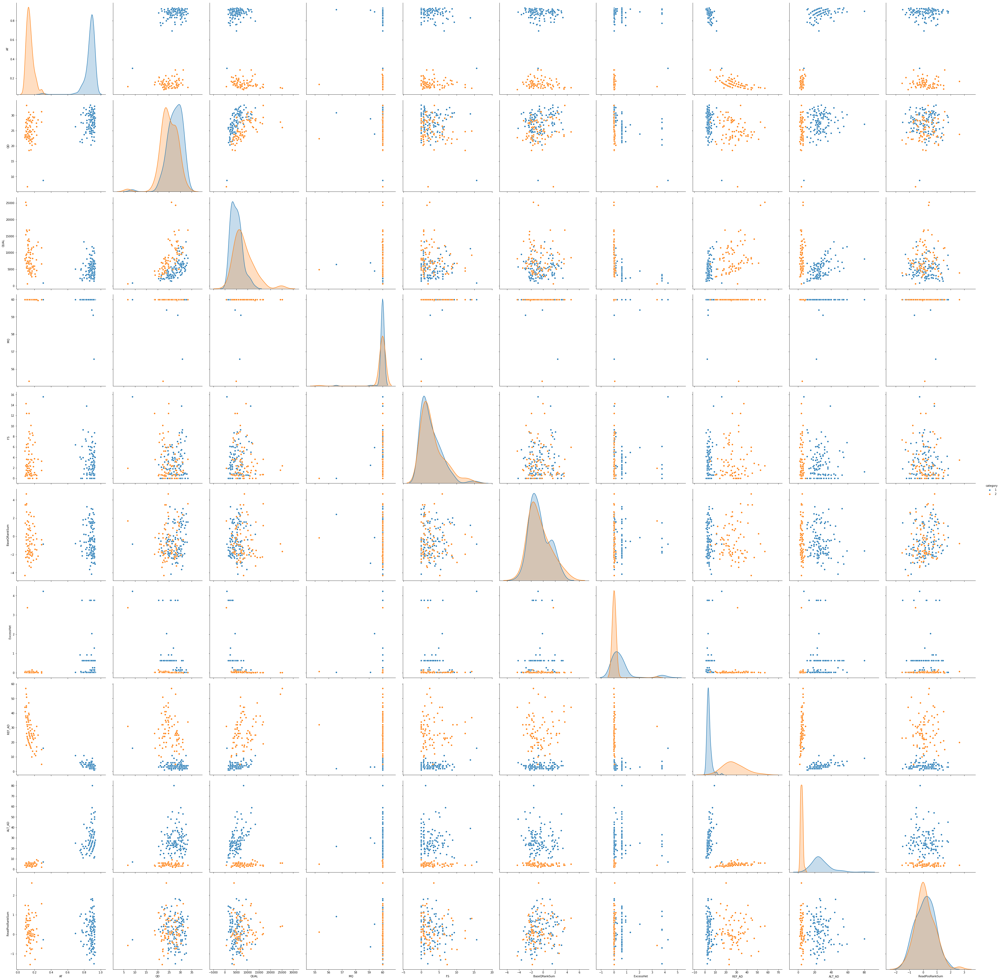

In [197]:
sns.pairplot(Ktest9, hue='category',size=5,vars=["AF","QD", "QUAL", "MQ", "FS","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

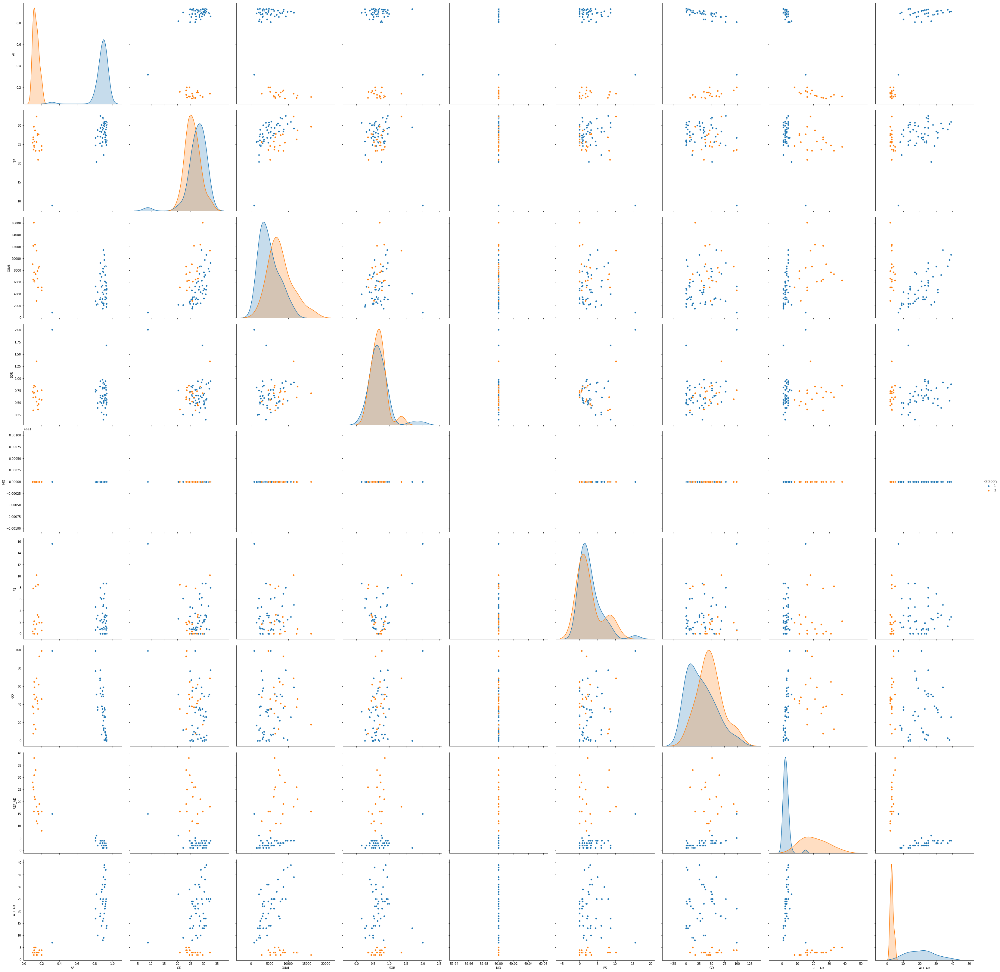

In [198]:
sns.pairplot(Ktest95, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR", "MQ", "FS","GQ","REF_AD", "ALT_AD"],kind='scatter')

In [47]:
X = np.array(Ktest5[["AF","QUAL", "ALT_AD", "QD", "MQ"]])
y = np.array(Ktest5['category'])
X.shape

(635, 5)

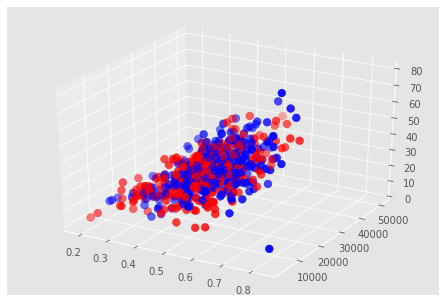

In [48]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y:
    assign.append(colors[row - 1])
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)

In [49]:
X8 = np.array(Ktest8[["AF","QUAL", "ALT_AD", "QD", "MQ"]])
y8 = np.array(Ktest8['category'])
X8.shape

(621, 5)

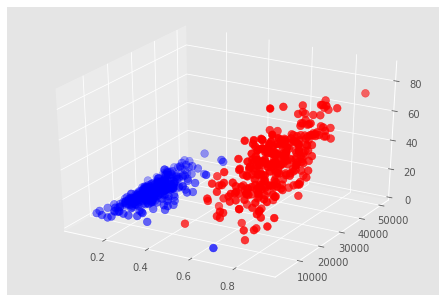

In [50]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y8:
    assign.append(colors[row - 1])
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)

In [51]:
X9 = np.array(Ktest9[["AF","QUAL", "ALT_AD", "QD", "MQ"]])
y9 = np.array(Ktest9['category'])
X9.shape

(376, 5)

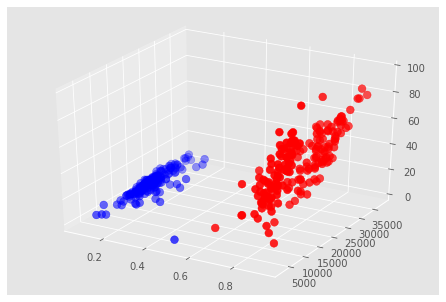

In [52]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y9:
    assign.append(colors[row - 1])
ax.scatter(X9[:, 0], X9[:, 1], X9[:, 2], c=assign,s=60)

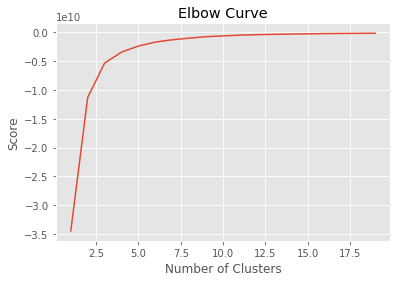

In [53]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [54]:
X = np.array(Ktest5[["AF","QUAL", "ALT_AD", "QD", "MQ"]])
y = np.array(Ktest5['category'])
X

array([[3.70370370e-01, 1.99635100e+04, 2.00000000e+01, 3.05700000e+01,
        6.00000000e+01],
       [6.21621622e-01, 2.24031100e+04, 4.60000000e+01, 2.96700000e+01,
        6.00000000e+01],
       [4.05063291e-01, 3.19380400e+04, 3.20000000e+01, 3.23300000e+01,
        6.00000000e+01],
       ...,
       [5.11111111e-01, 1.28708900e+04, 4.60000000e+01, 2.81000000e+01,
        6.00000000e+01],
       [5.73170732e-01, 2.80376000e+04, 4.70000000e+01, 2.58900000e+01,
        6.00000000e+01],
       [6.08695652e-01, 2.95475000e+04, 4.20000000e+01, 3.05200000e+01,
        6.00000000e+01]])

In [55]:
X = StandardScaler().fit_transform(X)
X

array([[-1.3734906 ,  0.18988476, -1.14287788,  0.75359416,  0.13930658],
       [ 1.26066543,  0.52108334,  1.3457681 ,  0.45364078,  0.13930658],
       [-1.00976478,  1.81553947,  0.00572796,  1.34016966,  0.13930658],
       ...,
       [ 0.10205656, -0.77300489,  1.3457681 , -0.06961123,  0.13930658],
       [ 0.75269899,  1.28601818,  1.44148525, -0.80616342,  0.13930658],
       [ 1.12514762,  1.49100126,  0.96289948,  0.73693009,  0.13930658]])

In [56]:
kmeans = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X)
centroids = kmeans.cluster_centers_
print(centroids)

[[ 0.35118027  0.58254822  0.49282764  0.35897445  0.10336688]
 [-0.4935147  -0.81865677 -0.69257218 -0.50446789 -0.14526179]]


In [57]:
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [58]:
X8 = np.array(Ktest8[["AF","QUAL", "ALT_AD", "QD", "MQ"]])
y8 = np.array(Ktest8['category'])
X8 = StandardScaler().fit_transform(X8)

X8.shape

(621, 5)

In [59]:
kmeans8 = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X8)
centroids8 = kmeans8.cluster_centers_
print(centroids8)

[[-0.89589137  0.08565554 -0.82110077 -0.22253823 -0.08785733]
 [ 1.02919009 -0.09840014  0.94327148  0.25564945  0.10092953]]


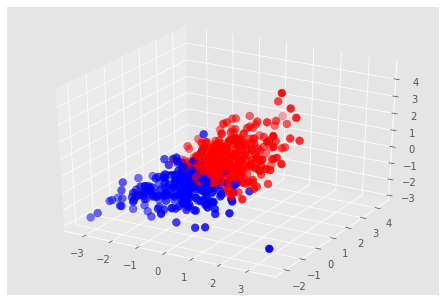

In [60]:
# Predicting the clusters
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)
ax.scatter(C[:, 0], C[:, 1], marker='*', c=colors, s=1000)

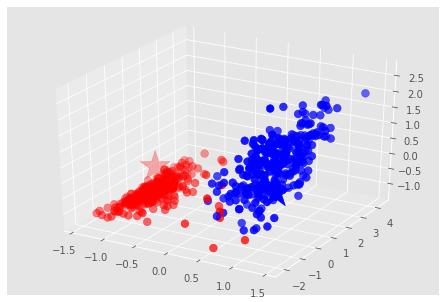

In [61]:
# Predicting the clusters
labels8 = kmeans8.predict(X8)
# Getting the cluster centers
C8 = kmeans8.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels8:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)
ax.scatter(C8[:, 0], C8[:, 1], marker='*', c=colors, s=1000)

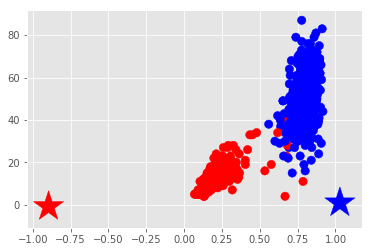

In [62]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['ALT_AD'].values

plt.scatter(f1, f2, c=assign, s=70)
plt.scatter(C8[:, 0], C8[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [63]:
copy =  pd.DataFrame()
copy['POS']=Ktest8['POS'].values
copy['AF']=Ktest8['AF'].values
copy['category']=Ktest8['category'].values
copy['label'] = labels8;
Ngrouped =  pd.DataFrame()
Ngrouped['colors']=colors
Ngrouped['N']=copy.groupby('label').size()
Ngrouped

,colors,N
0,red,332
1,blue,289


In [64]:
copy.head()

,POS,AF,category,label
0,1977,0.761905,1,1
1,6140,0.173077,2,0
2,7585,0.694444,1,1
3,9304,0.833333,1,1
4,10741,0.705882,1,1


In [65]:
 #metrics.adjusted_rand_score(labels_true, labels_pred)

# Compute Affinity Propagation

In [66]:
# #############################################################################
# Compute Affinity Propagation
X = X8
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))


Estimated number of clusters: 9
Silhouette Coefficient: 0.419


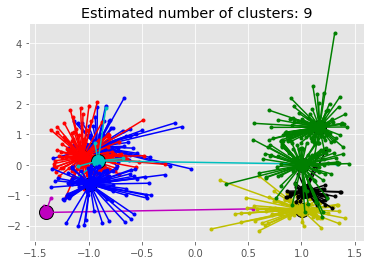

In [67]:

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Compute Agglomerative Clustering

In [68]:
X8 = np.array(Ktest8[["AF", "ALT_AD","DP", "FS"]])

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X8)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_


In [69]:
Ktest8['Label'] = labels

In [70]:
#Ktest8[Ktest8.Label == 2]

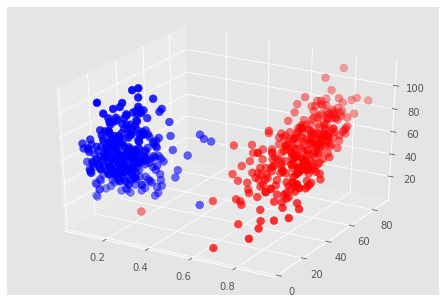

In [71]:
# Predicting the clusters

# Getting the cluster centers
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)


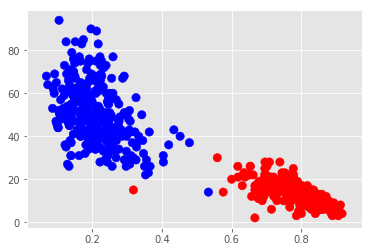

In [72]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['REF_AD'].values

colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

plt.scatter(f1, f2, c=assign, s=70)
plt.show()

# PCA: Principal Component Analysis
---
---

In [73]:
#cargamos los datos de entrada
dataframe = Ktest8
dataframe.tail(10)


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category,Label
1489,MTB_anc,4391553,.,C,T,20902.35,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.070e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:61,9:70:99:128,0,2057",1.0,0.5,2.0,-0.707,70.0,0.0021,7.365,0.7750,60.0,0.0,28.44,1.700,1.469,0/1,"61,9",99.0,"128,0,2057",NaN,NaN,NaN,2,61.0,9.0,0,1,70.0,0.871429,0.128571,False,5325.0,26.0,1,2,1
1490,MTB_anc,4391579,.,C,G,28977.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.450e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:9,62:71:99:2205,0,143",1.0,0.5,2.0,-0.245,71.0,0.0021,8.138,0.7750,60.0,0.0,31.92,0.085,0.114,0/1,"9,62",99.0,"2205,0,143",NaN,NaN,NaN,2,9.0,62.0,0,1,71.0,0.126761,0.873239,False,26.0,229.0,1,1,0
1491,MTB_anc,4391808,.,C,T,9786.81,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.340e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:21,52:73:99:1560,0,533",1.0,0.5,2.0,-1.340,73.0,0.1954,27.577,0.4677,60.0,0.0,24.71,0.530,1.052,0/1,"21,52",99.0,"1560,0,533",NaN,NaN,NaN,2,21.0,52.0,0,1,73.0,0.287671,0.712329,False,229.0,1370.0,1,1,0
1495,MTB_anc,4395964,.,C,A,21891.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.942e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:55,9:64:99:138,0,1854",1.0,0.5,2.0,-1.942,64.0,0.0069,2.875,0.7203,60.0,0.0,28.43,1.640,0.428,0/1,"55,9",99.0,"138,0,1854",NaN,NaN,NaN,2,55.0,9.0,0,1,64.0,0.859375,0.140625,False,577.0,3972.0,1,2,1
1496,MTB_anc,4399936,.,G,T,9462.82,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.431e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:11,57:68:99:1596,0,240",1.0,0.5,2.0,-2.431,68.0,0.1954,6.584,0.4679,60.0,0.0,24.33,-0.104,0.922,0/1,"11,57",99.0,"1596,0,240",NaN,NaN,NaN,2,11.0,57.0,0,1,68.0,0.161765,0.838235,False,3972.0,1817.0,1,1,0
1497,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:12,81:93:99:2411,0,240",1.0,0.5,2.0,-3.022,93.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"12,81",99.0,"2411,0,240",NaN,NaN,NaN,2,12.0,81.0,0,1,93.0,0.129032,0.870968,False,1817.0,2147.0,1,1,0
1498,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=60;Exc...,GT:AD:DP:GQ:PL,"0/1:47,13:60:99:387,0,1457",1.0,0.5,2.0,3.520,60.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"47,13",99.0,"387,0,1457",NaN,NaN,NaN,2,47.0,13.0,0,1,60.0,0.783333,0.216667,False,2147.0,3210.0,1,2,1
1499,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:20,70:90:99:2170,0,439",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"20,70",99.0,"2170,0,439",NaN,NaN,NaN,2,20.0,70.0,0,1,90.0,0.222222,0.777778,False,3210.0,478.0,1,1,0
1501,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:66,17:83:99:296,0,1912",1.0,0.5,2.0,-0.655,83.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"66,17",99.0,"296,0,1912",NaN,NaN,NaN,2,66.0,17.0,0,1,83.0,0.795181,0.204819,False,382.0,186.0,1,2,1
1502,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=58;Ex...,GT:AD:DP:GQ:PL,"0/1:38,20:58:99:506,0,1112",1.0,0.5,2.0,0.456,58.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"38,20",99.0,"506,0,1112",NaN,NaN,NaN,2,38.0,20.0,0,1,58.0,0.655172,0.344828,False,186.0,764.0,1,2,1


In [74]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo

In [75]:
df.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
0,0.761905,30.57,19963.51,0.434,42.0,42.0,60.0,0.0,1.003,99.0,0.72,0.0442,10.0,32.0,0.655
2,0.173077,29.67,22403.11,0.827,52.0,52.0,60.0,0.0,0.919,99.0,1.43,0.0069,43.0,9.0,-0.273
3,0.694444,32.33,31938.04,0.573,72.0,72.0,60.0,0.0,0.994,99.0,1.27,0.0111,22.0,50.0,-0.405
5,0.833333,33.15,33683.24,0.412,84.0,84.0,60.0,0.0,2.716,99.0,1.59,0.0021,14.0,70.0,-0.480
6,0.705882,30.67,25056.54,1.392,68.0,68.0,60.0,0.0,4.721,99.0,1.52,0.0442,20.0,48.0,-0.615


In [76]:
X_scaled.shape

(621, 15)

In [77]:
#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA

In [78]:
pca

PCA(copy=True, iterated_power='auto', n_components=0.85, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [79]:
print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 8 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (621, 8)
[0.1975217  0.18839519 0.12436442 0.10968146 0.08140738 0.06342859
 0.06146967 0.05414755]
suma: 0.8804159524723986


In [80]:
np.cumsum(pca.explained_variance_ratio_)

array([0.1975217 , 0.38591689, 0.51028131, 0.61996277, 0.70137015,
       0.76479873, 0.82626841, 0.88041595])

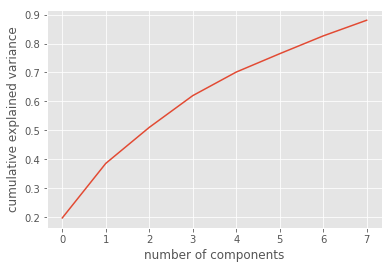

In [81]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

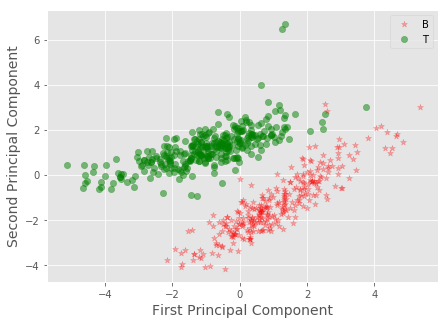

In [82]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=dataframe['Label'].values
cdict={0:'red',1:'green'}
labl={0:'B',1:'T'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [83]:
pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,0.344782,-0.051233,-0.393589,0.046382,-0.419408,-0.419405,-0.041494,-0.023573,0.284788,-0.109235,-0.129949,0.078110,-0.476931,0.153398,-0.018348
2,-0.459459,-0.216413,-0.239633,0.103192,-0.299582,-0.299734,-0.152871,-0.105188,0.109227,-0.104833,0.175789,0.041711,0.313332,-0.549420,0.066065
3,0.033483,-0.482897,-0.215588,0.227778,0.311079,0.310949,-0.291675,-0.040425,0.346883,0.090629,-0.168400,0.444713,0.107031,0.134819,-0.053471
4,0.086483,0.329522,0.145820,0.222587,0.084385,0.084542,-0.490318,-0.484663,0.179750,-0.389957,0.330707,-0.129500,-0.036496,0.102601,0.034299
5,0.040646,0.248136,0.135604,0.060888,-0.044508,-0.044441,-0.087793,0.512430,0.087505,0.027739,0.409298,0.496855,-0.042303,0.007906,0.464504
6,-0.060714,0.120037,0.168680,-0.453811,-0.044987,-0.045079,-0.244736,0.236104,0.026797,-0.372458,-0.103899,0.329023,0.033316,-0.068664,-0.602903
7,0.022604,0.138653,0.022240,0.637881,-0.069181,-0.068631,0.072554,0.128584,-0.134757,0.289274,0.256186,0.073043,-0.033952,-0.019756,-0.605999
8,-0.000895,-0.064271,0.047912,0.481274,0.026587,0.026591,0.187583,0.225378,-0.241730,-0.684092,-0.357259,0.018531,0.040409,-0.019978,0.134640


In [84]:
#cargamos los datos de entrada
dataframe = Ktest5
dataframe.tail()


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
1530,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:31,48:79:99:1342,0,986",1.0,0.5,2.0,-3.022,79.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"31,48",99.0,"1342,0,986",NaN,NaN,NaN,2,31.0,48.0,0,1,79.0,0.392405,0.607595,False,1817.0,2147.0,1,1
1531,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=63;Exc...,GT:AD:DP:GQ:PL,"0/1:25,38:63:99:1311,0,671",1.0,0.5,2.0,3.520,63.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"25,38",99.0,"1311,0,671",NaN,NaN,NaN,2,25.0,38.0,0,1,63.0,0.396825,0.603175,False,2147.0,3210.0,1,2
1532,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:44,46:90:99:1316,0,1210",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"44,46",99.0,"1316,0,1210",NaN,NaN,NaN,2,44.0,46.0,0,1,90.0,0.488889,0.511111,False,3210.0,478.0,1,1
1534,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:35,47:82:99:1260,0,943",1.0,0.5,2.0,-0.655,82.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"35,47",99.0,"1260,0,943",NaN,NaN,NaN,2,35.0,47.0,0,1,82.0,0.426829,0.573171,False,382.0,186.0,1,2
1535,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=69;Ex...,GT:AD:DP:GQ:PL,"0/1:27,42:69:99:1326,0,631",1.0,0.5,2.0,0.456,69.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"27,42",99.0,"1326,0,631",NaN,NaN,NaN,2,27.0,42.0,0,1,69.0,0.391304,0.608696,False,186.0,764.0,1,2


In [85]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo


#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA


print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 5 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (635, 8)
[0.25215994 0.15207652 0.11826714 0.08970832 0.07733107 0.06782797
 0.06094475 0.05533274]
suma: 0.8736484474003695


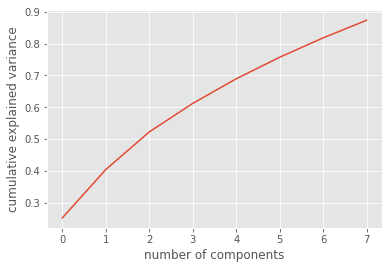

In [86]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [87]:
dataframe.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
0,MTB_anc,1977,.,G,A,19963.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.720;DP=54;Ex...,GT:AD:DP:GQ:PL,"0/1:34,20:54:99:571,0,1117",1.0,0.5,2.0,0.72,54.0,0.0442,1.003,0.5558,60.0,0.0,30.57,0.655,0.434,0/1,"34,20",99.0,"571,0,1117",NaN,NaN,NaN,2,34.0,20.0,0,1,54.0,0.629630,0.370370,False,1977.0,555.0,1,1
2,MTB_anc,6140,.,G,T,22403.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.43;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:28,46:74:99:1388,0,597",1.0,0.5,2.0,1.43,74.0,0.0069,0.919,0.7203,60.0,0.0,29.67,-0.273,0.827,0/1,"28,46",99.0,"1388,0,597",NaN,NaN,NaN,2,28.0,46.0,0,1,74.0,0.378378,0.621622,False,3608.0,1445.0,1,2
3,MTB_anc,7585,.,C,G,31938.04,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.27;DP=79;Exc...,GT:AD:DP:GQ:PL,"0/1:47,32:79:99:920,0,1429",1.0,0.5,2.0,1.27,79.0,0.0111,0.994,0.6656,60.0,0.0,32.33,-0.405,0.573,0/1,"47,32",99.0,"920,0,1429",NaN,NaN,NaN,2,47.0,32.0,0,1,79.0,0.594937,0.405063,False,1445.0,1558.0,1,1
5,MTB_anc,9304,.,A,G,33683.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.59;DP=77;Exc...,GT:AD:DP:GQ:PL,"0/1:35,42:77:99:1307,0,908",1.0,0.5,2.0,1.59,77.0,0.0021,2.716,0.7750,60.0,0.0,33.15,-0.480,0.412,0/1,"35,42",99.0,"1307,0,908",NaN,NaN,NaN,2,35.0,42.0,0,1,77.0,0.454545,0.545455,False,161.0,1437.0,1,1
6,MTB_anc,10741,.,C,G,25056.54,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.52;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:42,32:74:99:853,0,1395",1.0,0.5,2.0,1.52,74.0,0.0442,4.721,0.5564,60.0,0.0,30.67,-0.615,1.392,0/1,"42,32",99.0,"853,0,1395",NaN,NaN,NaN,2,42.0,32.0,0,1,74.0,0.567568,0.432432,False,1437.0,2719.0,1,1


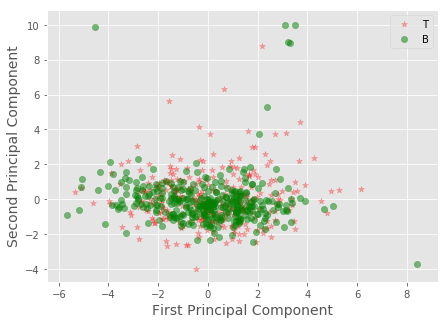

In [88]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=(dataframe['category'].values -1)
cdict={0:'red',1:'green'}
labl={0:'T',1:'B'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [89]:
pca.components_.shape

(8, 15)

In [90]:
# Dump components relations with features:
corr_PCA_col = pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])
corr_PCA_col

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,-0.047078,-0.007157,-0.331710,0.038587,-0.497742,-0.497758,-0.077715,-0.077704,0.178544,-0.102669,0.016048,-0.021019,-0.380742,-0.436166,0.017360
2,-0.425502,-0.298842,-0.250906,0.266429,0.138010,0.137989,-0.377956,-0.264411,0.350615,0.058983,0.053087,0.271109,0.353862,-0.126812,-0.028698
3,0.248902,-0.523920,-0.313934,-0.070194,0.036872,0.036733,0.249877,0.357657,0.160656,-0.081508,-0.415646,0.350702,-0.103568,0.163794,-0.035294
4,0.484275,-0.041157,-0.032420,0.084516,0.042035,0.042009,-0.400620,-0.509239,0.110393,-0.081501,-0.181341,-0.155241,-0.243672,0.312056,-0.315705
5,0.315390,0.151768,0.073275,0.194662,0.019397,0.019382,-0.204268,0.146271,0.208011,-0.240465,0.444923,0.400809,-0.146201,0.177683,0.507660
6,-0.123844,-0.014550,0.007179,-0.524728,0.064831,0.064716,-0.040815,-0.129988,0.126826,-0.769725,-0.087635,-0.138843,0.161130,-0.054483,0.132875
7,-0.036007,0.287460,0.206733,-0.299156,-0.046061,-0.045991,-0.199594,0.245654,0.134805,-0.018200,0.094588,0.487435,-0.014458,-0.061092,-0.640649
8,-0.021302,-0.027522,-0.030463,0.628421,0.018913,0.019174,0.234625,0.130731,-0.174844,-0.544728,0.171442,-0.088533,0.054834,-0.023705,-0.402474


In [91]:
# Get a series containing maximum value of each column
#maxValuesObj = corr_PCA_col.max()
#print('Maximum value in each column : ')
#print(maxValuesObj)

In [92]:
#corr_PCA_col.append(maxValuesObj, ignore_index=True)

# PCA 2: using covariances

In [93]:
cov_df = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]]

covarianceMatrix = pd.DataFrame(data = np.cov(cov_df, rowvar = False), columns = cov_df.columns, index = cov_df.columns)

In [94]:
covarianceMatrix

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
AF,0.009112,0.019223,9.461027e+01,-0.003324,0.006021,0.005896,0.026161,0.010286,-0.074161,-0.024598,-0.025090,-0.003223,-0.541604,0.547626,-0.001487
QD,0.019223,9.016998,1.136212e+04,-0.073768,-5.714213,-5.705673,-0.021747,-0.045947,-3.147937,0.069916,1.624365,-0.411653,-4.063703,-1.650510,0.103624
QUAL,94.610270,11362.124704,5.434315e+07,-286.744959,60978.853360,61019.483856,1228.676476,661.739022,-15211.144644,1999.716579,1291.466994,-572.489798,24137.112943,36841.740417,44.396527
SOR,-0.003324,-0.073768,-2.867450e+02,0.074177,-0.023774,-0.022681,-0.077244,-0.028705,0.174477,0.055638,0.057406,0.013007,0.181799,-0.205573,0.001825
dp,0.006021,-5.714213,6.097885e+04,-0.023774,293.869271,293.918528,1.039921,0.606332,-15.139822,6.572270,-0.891286,0.803951,146.695248,147.174023,-0.516296
DP,0.005896,-5.705673,6.101948e+04,-0.022681,293.918528,293.977208,1.041246,0.606470,-15.144799,6.573084,-0.889948,0.803530,146.725199,147.193328,-0.518212
MQ,0.026161,-0.021747,1.228676e+03,-0.077244,1.039921,1.041246,2.276039,0.573392,-2.153001,0.019117,-0.408008,-0.131918,-1.011120,2.051041,0.074541
MQRankSum,0.010286,-0.045947,6.617390e+02,-0.028705,0.606332,0.606470,0.573392,0.503267,-0.537410,-0.002828,-0.112854,0.085347,-0.279288,0.885620,0.062951
FS,-0.074161,-3.147937,-1.521114e+04,0.174477,-15.139822,-15.144799,-2.153001,-0.537410,24.109766,-1.180472,-0.147185,0.603762,-2.619458,-12.520364,0.072264
GQ,-0.024598,0.069916,1.999717e+03,0.055638,6.572270,6.573084,0.019117,-0.002828,-1.180472,6.954907,0.024635,0.009120,3.535845,3.036424,-0.117987


In [95]:
eigenvalues, eigenvectors = np.linalg.eig(covarianceMatrix)

In [96]:
eigenvalues

array([ 5.43433294e+07,  5.65762736e+02,  6.98639087e+01,  1.96530719e+01,
        6.76099138e+00,  5.74358751e+00,  3.00801784e+00,  2.10686440e+00,
        9.40778160e-01,  3.89619830e-01,  1.25091155e-01,  6.76932834e-02,
        5.61465097e-03,  7.13059480e-04, -3.02170990e-15])

In [97]:
eigenvectors.shape

(15, 15)

In [107]:
totalSum = sum(eigenvalues)
variablesExplained = [((i / totalSum)) for i in sorted(eigenvalues, reverse = True)]

In [105]:
variablesExplained

[0.9999875896393132,
 1.0410766540390697e-05,
 1.2855863359822839e-06,
 3.616419569203949e-07,
 1.244109912301591e-07,
 1.0568944342721882e-07,
 5.5351421080232e-08,
 3.8769031528965e-08,
 1.731153566611004e-08,
 7.169509101781069e-09,
 2.3018391419074837e-09,
 1.2456440203952018e-09,
 1.033168441820197e-10,
 1.312121724215326e-11,
 -5.560337281805217e-23]

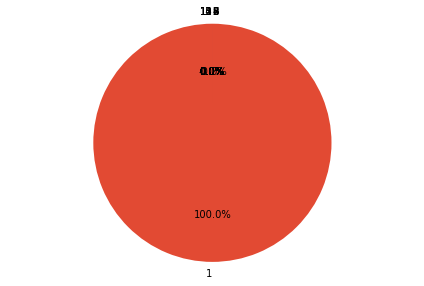

In [106]:
# Pie chart
labels = list(range(1,len(variablesExplained)+1))
labels = [str(i) for i in labels]

sizes = variablesExplained
#colors
#colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()

# Feature Selection

## 1. Univariate Selection AF 50:50

In [187]:
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y = Ktest5['category']    #target column i.e price range

In [188]:
X.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD
0,0.638298,29.52,8943.77,0.768,47.0,47.0,60.0,0.000,99.0,0.0034,17.0,30.0
2,0.494118,27.21,17522.05,0.630,85.0,85.0,60.0,0.000,99.0,0.0076,43.0,42.0
3,0.406780,30.51,11259.09,0.672,59.0,59.0,60.0,13.833,99.0,0.0267,35.0,24.0
5,0.547619,31.14,7504.71,0.630,42.0,42.0,60.0,1.556,99.0,0.0034,19.0,23.0
6,0.388889,33.12,8147.77,0.316,36.0,36.0,60.0,6.343,99.0,0.0034,22.0,14.0


In [189]:
X[X.values < 0]

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD


In [190]:
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=12)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

        Specs          Score
2        QUAL  190508.788227
9   ExcessHet      29.790828
1          QD       5.817866
5          DP       2.736724
4          dp       2.634697
10     REF_AD       2.606471
7          FS       0.664362
11     ALT_AD       0.463897
3         SOR       0.076658
8          GQ       0.046871
6          MQ       0.001570
0          AF       0.000640


## 1. Univariate Selection AF 80:20

In [193]:
X8 = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y8 = Ktest8['category']    #target column i.e price range

In [192]:
#apply SelectKBest class to extract top 10 best features
bestfeatures8 = SelectKBest(score_func=chi2, k=12)
fit8 = bestfeatures.fit(X8,y8)
dfscores8 = pd.DataFrame(fit8.scores_)
dfcolumns8 = pd.DataFrame(X8.columns)
#concat two dataframes for better visualization 
featureScores8 = pd.concat([dfcolumns8,dfscores8],axis=1)
featureScores8.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores8.nlargest(12,'Score'))  #print 10 best features

        Specs          Score
2        QUAL  193755.053766
10     REF_AD    4111.466062
11     ALT_AD    3854.022809
0          AF      96.838719
9   ExcessHet      27.952330
1          QD       7.851183
4          dp       4.154200
5          DP       4.017204
8          GQ       2.678745
7          FS       1.173500
3         SOR       0.129166
6          MQ       0.003930


# 2. Feature Importance

In [158]:
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest5['category']    #target column i.e price range

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[0.0543467  0.12909524 0.15188661 0.05134171 0.04914096 0.05050492
 0.00629972 0.05585803 0.00309787 0.23681732 0.04460898 0.04614487
 0.05597613 0.00462878 0.06025213]


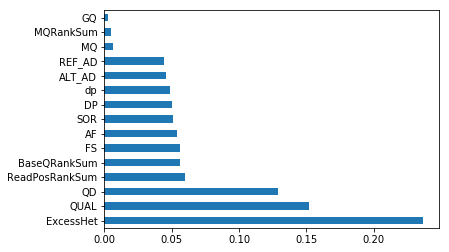

In [159]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [160]:
X = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest8['category']    #target column i.e price range

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[0.62512784 0.0175221  0.02738503 0.00499438 0.00206509 0.00704335
 0.00301474 0.00295658 0.00808514 0.05052246 0.06943677 0.17016025
 0.00501736 0.00096916 0.00569973]


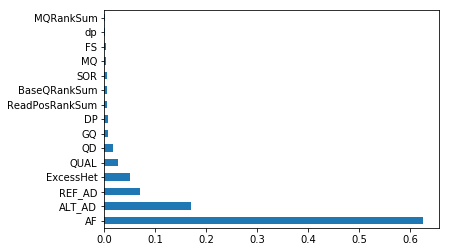

In [161]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

# 3.Correlation Matrix with Heatmap

In [163]:
data = Ktest5[['POS', 'QUAL', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'REF_AD',
       'ALT_AD', 'dp', 'aF', 'AF',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category']]
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest5['category']    #target column i.e price range

In [155]:
data.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category'],
      dtype='object')

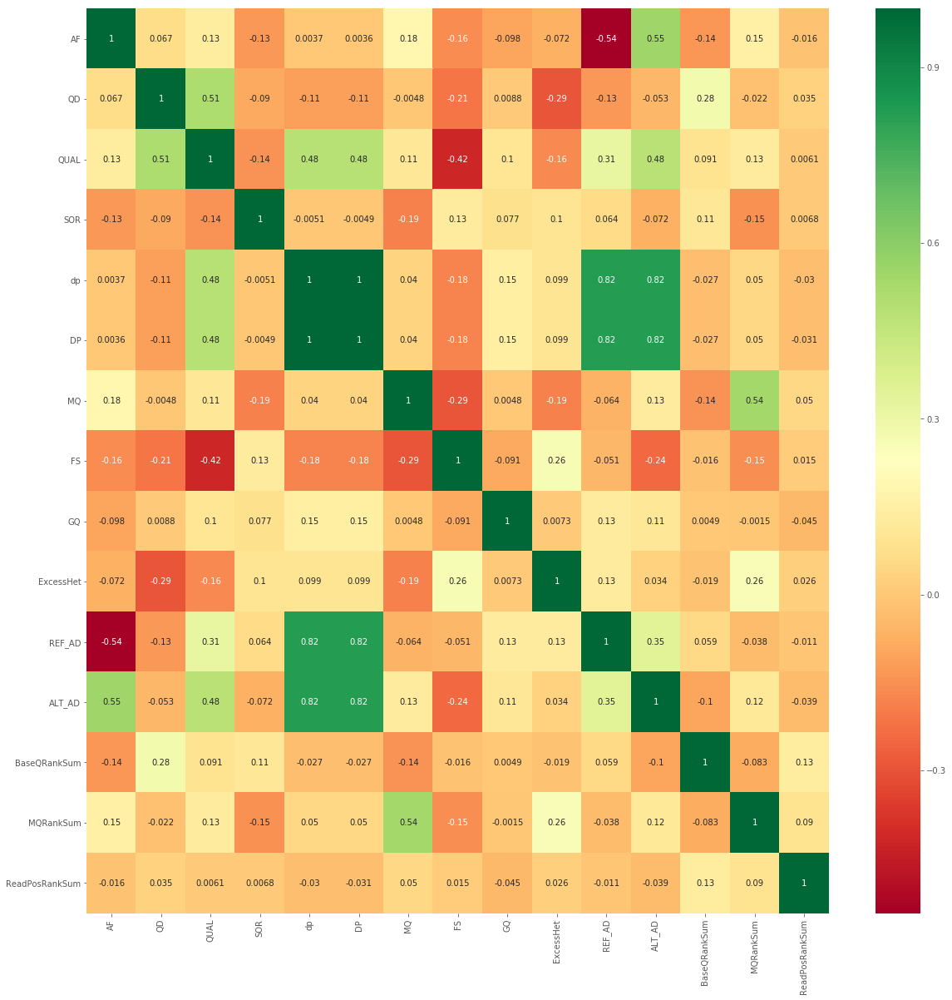

In [158]:
#get correlations of each features in dataset
corrmat = X.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(X[top_corr_features].corr(),annot=True,cmap="RdYlGn")

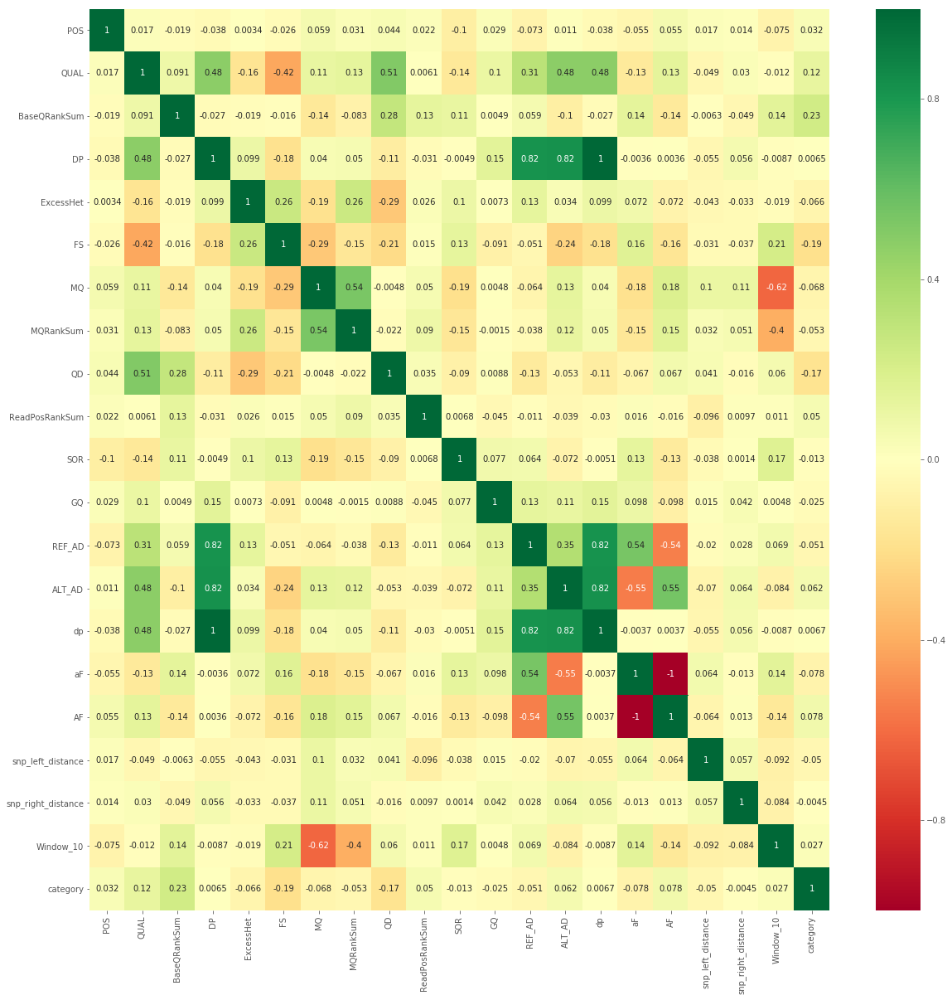

In [164]:
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [165]:
data8 = Ktest8[['POS', 'QUAL', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'REF_AD',
       'ALT_AD', 'dp', 'aF', 'AF',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category']]
X8 = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y8 = Ktest8['category']    #target column i.e price range

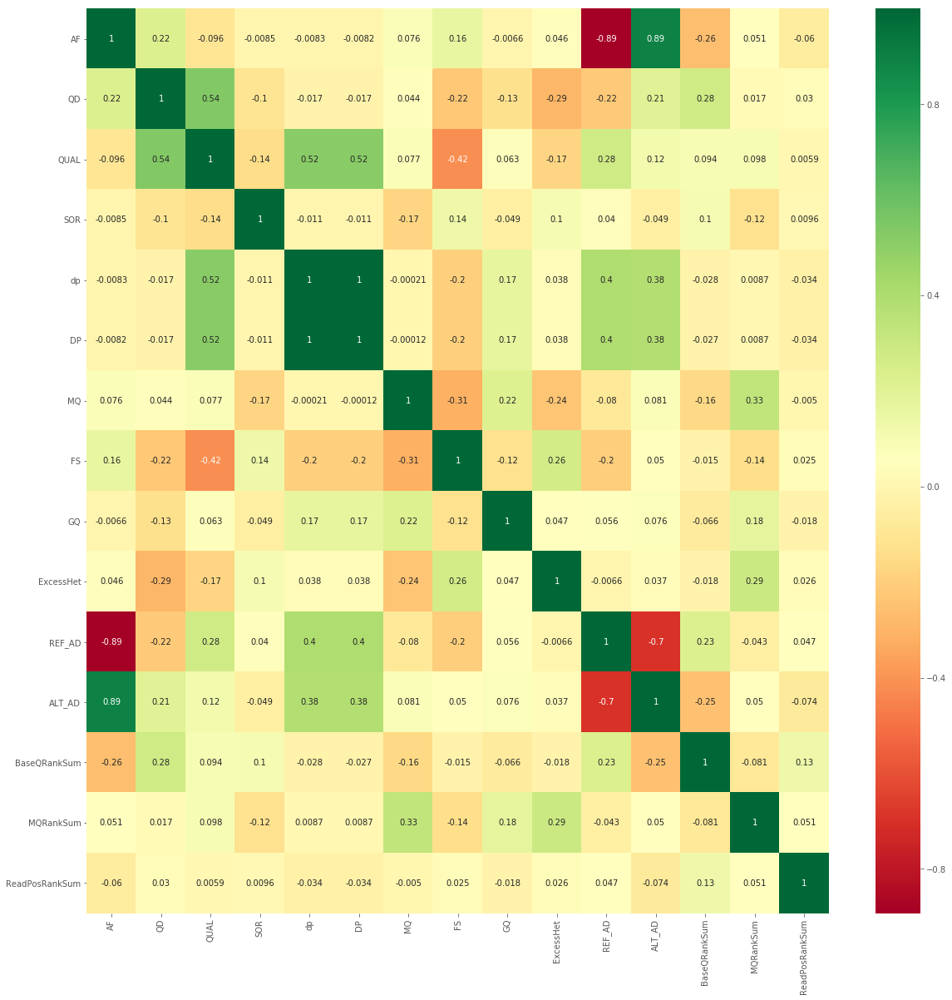

In [166]:
#get correlations of each features in dataset
corrmat = X8.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(X8[top_corr_features].corr(),annot=True,cmap="RdYlGn")

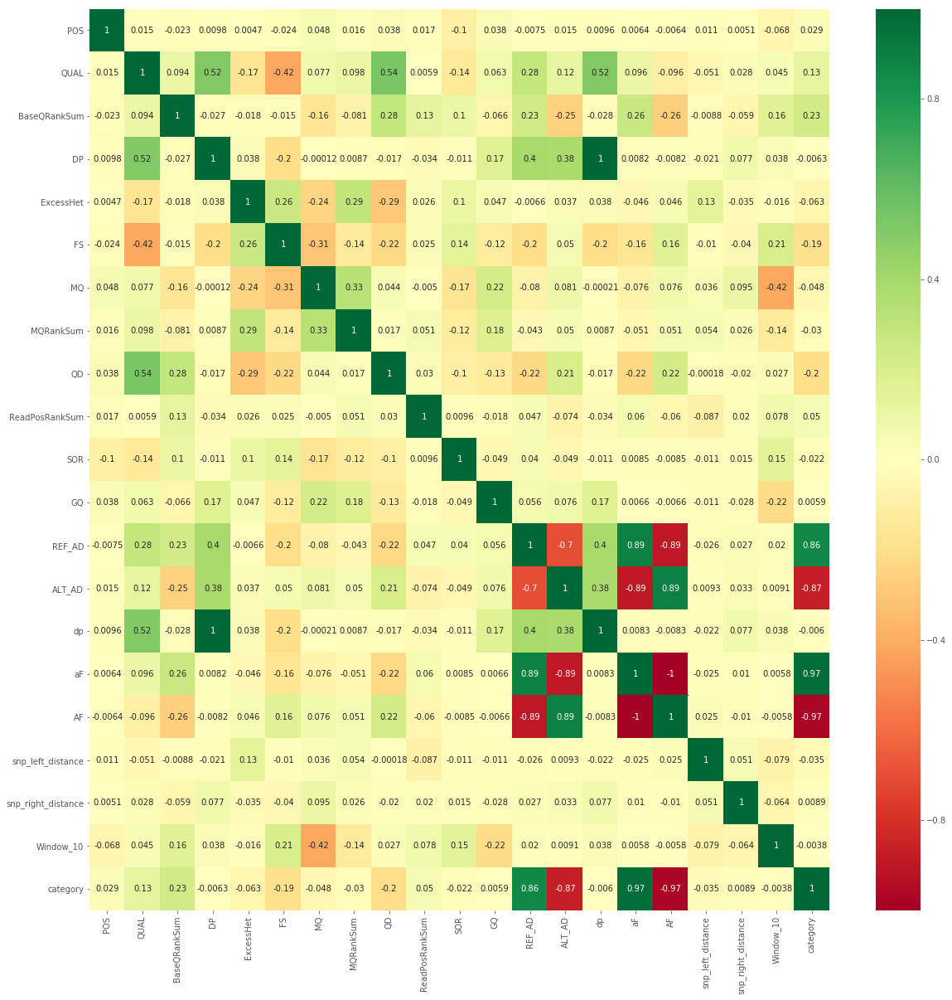

In [167]:
#get correlations of each features in dataset
corrmat = data8.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data8[top_corr_features].corr(),annot=True,cmap="RdYlGn")